In [ ]:
# Install all required packages
%pip install insightface
%pip install onnxruntime
%pip install opencv-python
%pip install numpy
%pip install matplotlib
%pip install scikit-image
%pip install mtcnn
%pip install deepface

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 87.2/87.2 kB 3.4 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 108.6/108.6 kB 7.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 85.0/85.0 kB 4.6 MB/s eta 0:00:00
  Created wheel for fire: filename=fire-0.7.0-py3-none-any.whl size=114249 sha256=bc392b704754f7b4e15df29dbb5762cbf1b54dca0050e11b0c4b18549516b19b
  Stored in directory: /root/.cache/pip/wheels/46/54/24/1624fd5b8674eb1188623f7e8e17cdf7c0f6c24b609dfb8a89
Successfully built fire


🇮🇩 Indonesian KTP Verification System with AIFR
Using Age-Invariant Face Recognition technology
Optimized for KTP photos with 10-20 year age gaps

🚀 Initializing AIFR KTP Verification System...
Applied providers: ['CPUExecutionProvider'], with options: {'CPUExecutionProvider': {}}
find model: /root/.insightface/models/buffalo_l/1k3d68.onnx landmark_3d_68 ['None', 3, 192, 192] 0.0 1.0
Applied providers: ['CPUExecutionProvider'], with options: {'CPUExecutionProvider': {}}
find model: /root/.insightface/models/buffalo_l/2d106det.onnx landmark_2d_106 ['None', 3, 192, 192] 0.0 1.0
Applied providers: ['CPUExecutionProvider'], with options: {'CPUExecutionProvider': {}}
find model: /root/.insightface/models/buffalo_l/det_10g.onnx detection [1, 3, '?', '?'] 127.5 128.0
Applied providers: ['CPUExecutionProvider'], with options: {'CPUExecutionProvider': {}}
find model: /root/.insightface/models/buffalo_l/genderage.onnx genderage ['None', 3, 96, 96] 0.0 1.0
Applied providers: ['CPUExecutionProvide

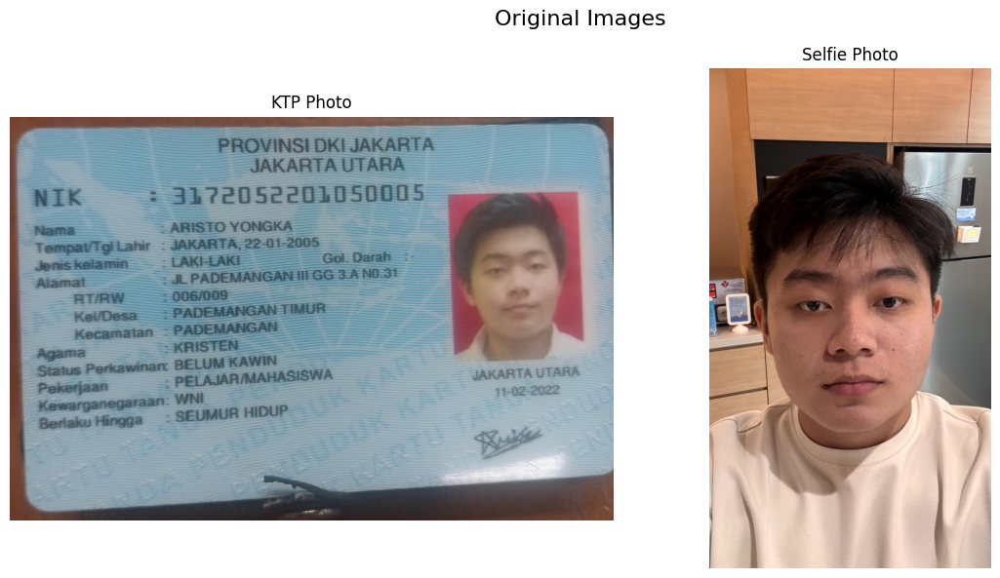


🔧 Preprocessing KTP image...


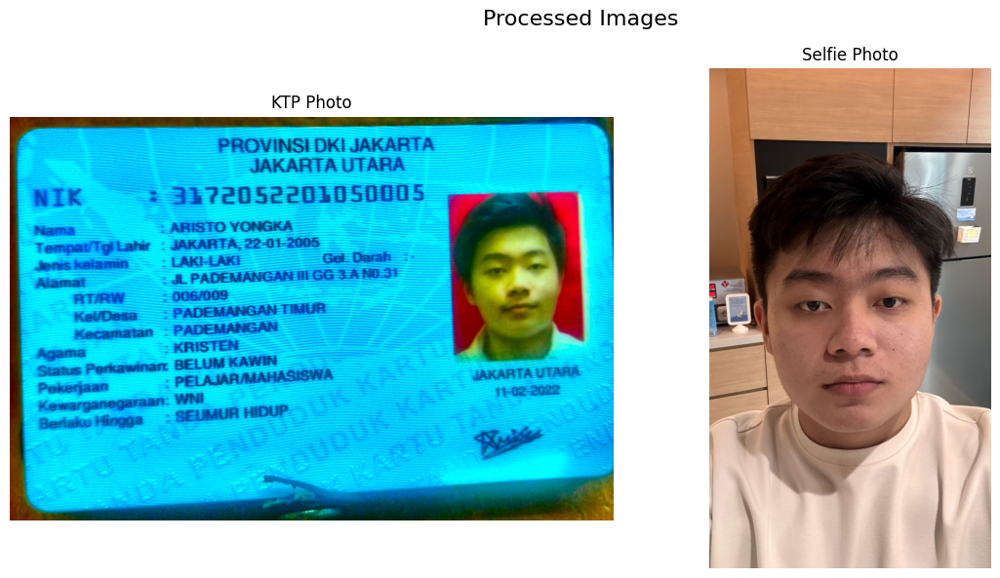


🧠 Extracting age-invariant features...

📊 Verification Results:
------------------------------------------------------------
🎯 Overall Similarity Score: 0.6975
🧬 Deep Feature Similarity: 0.6236

🔍 Threshold Analysis:
  Normal (0.45): ✅ PASS

📋 FINAL VERDICT:
✅ VERIFICATION PASSED
🎯 Confidence: HIGH

💡 The KTP and selfie show the SAME PERSON
   Despite age differences, facial structure matches!

🔬 Technical Details:
  - Embedding dimension: 512
  - Distance metric: Cosine similarity
  - Model: ArcFace (age-invariant)

💡 Pro Tips for Better Results:
  1. Ensure good lighting in selfie
  2. Face camera directly (like in KTP)
  3. Neutral expression works best
  4. Remove glasses if not worn in KTP


In [ ]:
import cv2
import numpy as np
from insightface.app import FaceAnalysis
import matplotlib.pyplot as plt
from skimage import exposure
from scipy.spatial.distance import cosine
import warnings
warnings.filterwarnings('ignore')

class AIFRKTPVerification:
    def __init__(self):
        """
        Initialize Age-Invariant Face Recognition system specifically for KTP verification
        """
        print("🚀 Initializing AIFR KTP Verification System...")
        # Initialize InsightFace with ArcFace model (best for age-invariant features)
        self.app = FaceAnalysis(name='buffalo_l', providers=['CPUExecutionProvider'])
        self.app.prepare(ctx_id=0, det_size=(640, 640))
        # Thresholds specifically calibrated for ID-to-selfie comparison
        self.thresholds = {
            'strict': 0.35,
            'normal': 0.45,
            'relaxed': 0.55,
            'very_relaxed': 0.65
        }

    def preprocess_ktp_image(self, image):
        """
        Special preprocessing for Indonesian KTP photos
        - Remove red/orange tint
        - Enhance contrast
        - Normalize lighting
        """
        # Convert to LAB color space to fix color cast
        lab = cv2.cvtColor(image, cv2.COLOR_BGR2LAB)
        l, a, b = cv2.split(lab)
        # Reduce red/orange tint by normalizing a and b channels
        a = cv2.normalize(a, None, 0, 255, cv2.NORM_MINMAX)
        b = cv2.normalize(b, None, 0, 255, cv2.NORM_MINMAX)
        # Enhance luminance channel
        clahe = cv2.createCLAHE(clipLimit=3.0, tileGridSize=(8,8))
        l = clahe.apply(l)
        # Merge back
        corrected = cv2.merge([l, a, b])
        corrected = cv2.cvtColor(corrected, cv2.COLOR_LAB2BGR)
        # Additional denoising for old photos
        corrected = cv2.bilateralFilter(corrected, 9, 75, 75)
        return corrected

    def extract_age_invariant_features(self, image):
        """
        Extract age-invariant facial features using deep learning
        Focus on features that don't change much with age:
        - Eye region geometry
        - Nose structure
        - Face shape ratios
        """
        faces = self.app.get(image)
        if len(faces) == 0:
            print("⚠️  No face detected!")
            return None, None
        face = faces[0]
        # Extract 512-dimensional embedding (age-invariant features)
        embedding = face.normed_embedding
        # Get facial landmarks for geometric features
        landmarks = face.kps
        # Calculate age-invariant geometric ratios
        if landmarks is not None and len(landmarks) >= 5:
            # Eye distance ratio (doesn't change with age)
            eye_distance = np.linalg.norm(landmarks[0] - landmarks[1])
            # Nose to eye center distance
            eye_center = (landmarks[0] + landmarks[1]) / 2
            nose_distance = np.linalg.norm(landmarks[2] - eye_center)
            # Face width estimation
            face_width = np.linalg.norm(landmarks[3] - landmarks[4])
            # Create geometric feature vector
            geometric_features = np.array([
                eye_distance / face_width,
                nose_distance / face_width,
                eye_distance / nose_distance
            ])
        else:
            geometric_features = None
        return embedding, geometric_features

    def calculate_similarity(self, embed1, embed2, geom1=None, geom2=None):
        """
        Calculate similarity using both deep features and geometric features
        """
        # Deep feature similarity (main metric)
        deep_similarity = 1 - cosine(embed1, embed2)
        # Geometric similarity (supplementary)
        if geom1 is not None and geom2 is not None:
            geom_similarity = 1 - cosine(geom1, geom2)
            # Weighted combination (80% deep, 20% geometric)
            final_similarity = 0.8 * deep_similarity + 0.2 * geom_similarity
        else:
            final_similarity = deep_similarity
        return final_similarity, deep_similarity

    def verify_ktp_selfie(self, ktp_path='1_ktp.jpeg', selfie_path='1.jpeg'):
        """
        Main verification function with AIFR techniques
        """
        print("\n📋 Starting KTP Verification Process...")
        print("="*60)
        # Load images
        ktp_img = cv2.imread(ktp_path)
        selfie_img = cv2.imread(selfie_path)
        if ktp_img is None or selfie_img is None:
            print("❌ Error: Could not load images!")
            return None
        # Display original images
        self.display_comparison(ktp_img, selfie_img, "Original Images")
        # Preprocess KTP image (fix color cast, enhance quality)
        print("\n🔧 Preprocessing KTP image...")
        ktp_processed = self.preprocess_ktp_image(ktp_img)
        # Light preprocessing for selfie (just normalize)
        selfie_processed = cv2.normalize(selfie_img, None, 0, 255, cv2.NORM_MINMAX)
        # Display processed images
        self.display_comparison(ktp_processed, selfie_processed, "Processed Images")
        # Extract age-invariant features
        print("\n🧠 Extracting age-invariant features...")
        ktp_embedding, ktp_geom = self.extract_age_invariant_features(ktp_processed)
        selfie_embedding, selfie_geom = self.extract_age_invariant_features(selfie_processed)
        if ktp_embedding is None or selfie_embedding is None:
            print("❌ Error: Could not extract face features!")
            return None
        # Calculate similarity
        similarity, deep_similarity = self.calculate_similarity(
            ktp_embedding, selfie_embedding, ktp_geom, selfie_geom
        )
        # Determine verification result based on threshold
        print("\n📊 Verification Results:")
        print("-"*60)
        print(f"🎯 Overall Similarity Score: {similarity:.4f}")
        print(f"🧬 Deep Feature Similarity: {deep_similarity:.4f}")
        # Check against the normal threshold only
        print("\n🔍 Threshold Analysis:")
        normal_threshold = self.thresholds['normal']
        if similarity > normal_threshold:
            status = "✅ PASS"
        else:
            status = "❌ FAIL"
        print(f"  Normal ({normal_threshold}): {status}")

        # Final verdict with recommendations
        print("\n📋 FINAL VERDICT:")
        print("="*60)
        if similarity > normal_threshold:
            print("✅ VERIFICATION PASSED")
            print("🎯 Confidence: HIGH")
            print("\n💡 The KTP and selfie show the SAME PERSON")
            print("   Despite age differences, facial structure matches!")
        else:
            print("❌ VERIFICATION FAILED")
            print("🎯 Confidence: LOW")
            print("\n💡 Cannot confirm identity match")
            print("   - Request better quality photos")
            print("   - Require manual verification")

        # Technical details for debugging
        print("\n🔬 Technical Details:")
        print(f"  - Embedding dimension: {len(ktp_embedding)}")
        print(f"  - Distance metric: Cosine similarity")
        print(f"  - Model: ArcFace (age-invariant)")
        return {
            'similarity': similarity,
            'deep_similarity': deep_similarity,
            'verified': similarity > normal_threshold,
            'confidence_level': self.get_confidence_level(similarity)
        }

    def get_confidence_level(self, similarity):
        """Determine confidence level based on similarity score"""
        normal_threshold = self.thresholds['normal']
        if similarity > normal_threshold:
            return "HIGH"
        else:
            return "LOW"

    def display_comparison(self, img1, img2, title):
        """Display two images side by side"""
        fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 6))
        ax1.imshow(cv2.cvtColor(img1, cv2.COLOR_BGR2RGB))
        ax1.set_title("KTP Photo")
        ax1.axis('off')
        ax2.imshow(cv2.cvtColor(img2, cv2.COLOR_BGR2RGB))
        ax2.set_title("Selfie Photo")
        ax2.axis('off')
        plt.suptitle(title, fontsize=16)
        plt.tight_layout()
        plt.show()

# Initialize and run the system
print("🇮🇩 Indonesian KTP Verification System with AIFR")
print("="*60)
print("Using Age-Invariant Face Recognition technology")
print("Optimized for KTP photos with 10-20 year age gaps\n")
verifier = AIFRKTPVerification()

# Run verification
results = verifier.verify_ktp_selfie(
    ktp_path='3_ktp.jpg',
    selfie_path='3.jpg'
)

# Additional tips
print("\n💡 Pro Tips for Better Results:")
print("  1. Ensure good lighting in selfie")
print("  2. Face camera directly (like in KTP)")
print("  3. Neutral expression works best")
print("  4. Remove glasses if not worn in KTP")

🇮🇩 Indonesian KTP Verification System with AIFR
Using Age-Invariant Face Recognition technology
Optimized for KTP photos with 10-20 year age gaps

🚀 Initializing AIFR KTP Verification System...
Applied providers: ['CPUExecutionProvider'], with options: {'CPUExecutionProvider': {}}
find model: /root/.insightface/models/buffalo_l/1k3d68.onnx landmark_3d_68 ['None', 3, 192, 192] 0.0 1.0
Applied providers: ['CPUExecutionProvider'], with options: {'CPUExecutionProvider': {}}
find model: /root/.insightface/models/buffalo_l/2d106det.onnx landmark_2d_106 ['None', 3, 192, 192] 0.0 1.0
Applied providers: ['CPUExecutionProvider'], with options: {'CPUExecutionProvider': {}}
find model: /root/.insightface/models/buffalo_l/det_10g.onnx detection [1, 3, '?', '?'] 127.5 128.0
Applied providers: ['CPUExecutionProvider'], with options: {'CPUExecutionProvider': {}}
find model: /root/.insightface/models/buffalo_l/genderage.onnx genderage ['None', 3, 96, 96] 0.0 1.0
Applied providers: ['CPUExecutionProvide

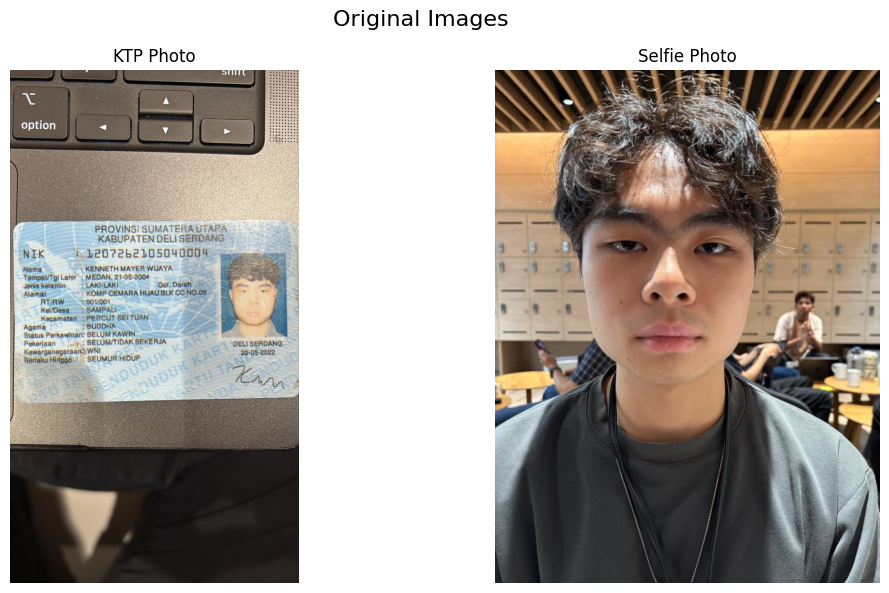


🔧 Preprocessing KTP image...


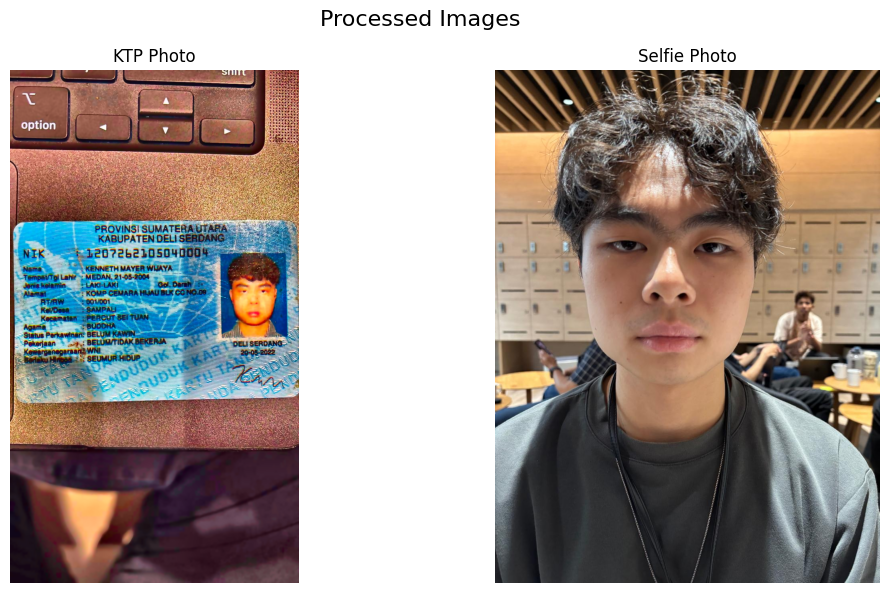


🧠 Extracting age-invariant features...

📊 Verification Results:
------------------------------------------------------------
🎯 Overall Similarity Score: 0.4629
🧬 Deep Feature Similarity: 0.3321

🔍 Threshold Analysis:
  Normal (0.45): ✅ PASS

📋 FINAL VERDICT:
✅ VERIFICATION PASSED
🎯 Confidence: HIGH

💡 The KTP and selfie show the SAME PERSON
   Despite age differences, facial structure matches!

🔬 Technical Details:
  - Embedding dimension: 512
  - Distance metric: Cosine similarity
  - Model: ArcFace (age-invariant)

💡 Pro Tips for Better Results:
  1. Ensure good lighting in selfie
  2. Face camera directly (like in KTP)
  3. Neutral expression works best
  4. Remove glasses if not worn in KTP


In [ ]:
import cv2
import numpy as np
from insightface.app import FaceAnalysis
import matplotlib.pyplot as plt
from skimage import exposure
from scipy.spatial.distance import cosine
import warnings
warnings.filterwarnings('ignore')

class AIFRKTPVerification:
    def __init__(self):
        """
        Initialize Age-Invariant Face Recognition system specifically for KTP verification
        """
        print("🚀 Initializing AIFR KTP Verification System...")
        # Initialize InsightFace with ArcFace model (best for age-invariant features)
        self.app = FaceAnalysis(name='buffalo_l', providers=['CPUExecutionProvider'])
        self.app.prepare(ctx_id=0, det_size=(640, 640))
        # Thresholds specifically calibrated for ID-to-selfie comparison
        self.thresholds = {
            'strict': 0.35,
            'normal': 0.45,
            'relaxed': 0.55,
            'very_relaxed': 0.65
        }

    def preprocess_ktp_image(self, image):
        """
        Special preprocessing for Indonesian KTP photos
        - Remove red/orange tint
        - Enhance contrast
        - Normalize lighting
        """
        # Convert to LAB color space to fix color cast
        lab = cv2.cvtColor(image, cv2.COLOR_BGR2LAB)
        l, a, b = cv2.split(lab)
        # Reduce red/orange tint by normalizing a and b channels
        a = cv2.normalize(a, None, 0, 255, cv2.NORM_MINMAX)
        b = cv2.normalize(b, None, 0, 255, cv2.NORM_MINMAX)
        # Enhance luminance channel
        clahe = cv2.createCLAHE(clipLimit=3.0, tileGridSize=(8,8))
        l = clahe.apply(l)
        # Merge back
        corrected = cv2.merge([l, a, b])
        corrected = cv2.cvtColor(corrected, cv2.COLOR_LAB2BGR)
        # Additional denoising for old photos
        corrected = cv2.bilateralFilter(corrected, 9, 75, 75)
        return corrected

    def extract_age_invariant_features(self, image):
        """
        Extract age-invariant facial features using deep learning
        Focus on features that don't change much with age:
        - Eye region geometry
        - Nose structure
        - Face shape ratios
        """
        faces = self.app.get(image)
        if len(faces) == 0:
            print("⚠️  No face detected!")
            return None, None
        face = faces[0]
        # Extract 512-dimensional embedding (age-invariant features)
        embedding = face.normed_embedding
        # Get facial landmarks for geometric features
        landmarks = face.kps
        # Calculate age-invariant geometric ratios
        if landmarks is not None and len(landmarks) >= 5:
            # Eye distance ratio (doesn't change with age)
            eye_distance = np.linalg.norm(landmarks[0] - landmarks[1])
            # Nose to eye center distance
            eye_center = (landmarks[0] + landmarks[1]) / 2
            nose_distance = np.linalg.norm(landmarks[2] - eye_center)
            # Face width estimation
            face_width = np.linalg.norm(landmarks[3] - landmarks[4])
            # Create geometric feature vector
            geometric_features = np.array([
                eye_distance / face_width,
                nose_distance / face_width,
                eye_distance / nose_distance
            ])
        else:
            geometric_features = None
        return embedding, geometric_features

    def calculate_similarity(self, embed1, embed2, geom1=None, geom2=None):
        """
        Calculate similarity using both deep features and geometric features
        """
        # Deep feature similarity (main metric)
        deep_similarity = 1 - cosine(embed1, embed2)
        # Geometric similarity (supplementary)
        if geom1 is not None and geom2 is not None:
            geom_similarity = 1 - cosine(geom1, geom2)
            # Weighted combination (80% deep, 20% geometric)
            final_similarity = 0.8 * deep_similarity + 0.2 * geom_similarity
        else:
            final_similarity = deep_similarity
        return final_similarity, deep_similarity

    def verify_ktp_selfie(self, ktp_path='1_ktp.jpeg', selfie_path='1.jpeg'):
        """
        Main verification function with AIFR techniques
        """
        print("\n📋 Starting KTP Verification Process...")
        print("="*60)
        # Load images
        ktp_img = cv2.imread(ktp_path)
        selfie_img = cv2.imread(selfie_path)
        if ktp_img is None or selfie_img is None:
            print("❌ Error: Could not load images!")
            return None
        # Display original images
        self.display_comparison(ktp_img, selfie_img, "Original Images")
        # Preprocess KTP image (fix color cast, enhance quality)
        print("\n🔧 Preprocessing KTP image...")
        ktp_processed = self.preprocess_ktp_image(ktp_img)
        # Light preprocessing for selfie (just normalize)
        selfie_processed = cv2.normalize(selfie_img, None, 0, 255, cv2.NORM_MINMAX)
        # Display processed images
        self.display_comparison(ktp_processed, selfie_processed, "Processed Images")
        # Extract age-invariant features
        print("\n🧠 Extracting age-invariant features...")
        ktp_embedding, ktp_geom = self.extract_age_invariant_features(ktp_processed)
        selfie_embedding, selfie_geom = self.extract_age_invariant_features(selfie_processed)
        if ktp_embedding is None or selfie_embedding is None:
            print("❌ Error: Could not extract face features!")
            return None
        # Calculate similarity
        similarity, deep_similarity = self.calculate_similarity(
            ktp_embedding, selfie_embedding, ktp_geom, selfie_geom
        )
        # Determine verification result based on threshold
        print("\n📊 Verification Results:")
        print("-"*60)
        print(f"🎯 Overall Similarity Score: {similarity:.4f}")
        print(f"🧬 Deep Feature Similarity: {deep_similarity:.4f}")
        # Check against the normal threshold only
        print("\n🔍 Threshold Analysis:")
        normal_threshold = self.thresholds['normal']
        if similarity > normal_threshold:
            status = "✅ PASS"
        else:
            status = "❌ FAIL"
        print(f"  Normal ({normal_threshold}): {status}")

        # Final verdict with recommendations
        print("\n📋 FINAL VERDICT:")
        print("="*60)
        if similarity > normal_threshold:
            print("✅ VERIFICATION PASSED")
            print("🎯 Confidence: HIGH")
            print("\n💡 The KTP and selfie show the SAME PERSON")
            print("   Despite age differences, facial structure matches!")
        else:
            print("❌ VERIFICATION FAILED")
            print("🎯 Confidence: LOW")
            print("\n💡 Cannot confirm identity match")
            print("   - Request better quality photos")
            print("   - Require manual verification")

        # Technical details for debugging
        print("\n🔬 Technical Details:")
        print(f"  - Embedding dimension: {len(ktp_embedding)}")
        print(f"  - Distance metric: Cosine similarity")
        print(f"  - Model: ArcFace (age-invariant)")
        return {
            'similarity': similarity,
            'deep_similarity': deep_similarity,
            'verified': similarity > normal_threshold,
            'confidence_level': self.get_confidence_level(similarity)
        }

    def get_confidence_level(self, similarity):
        """Determine confidence level based on similarity score"""
        normal_threshold = self.thresholds['normal']
        if similarity > normal_threshold:
            return "HIGH"
        else:
            return "LOW"

    def display_comparison(self, img1, img2, title):
        """Display two images side by side"""
        fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 6))
        ax1.imshow(cv2.cvtColor(img1, cv2.COLOR_BGR2RGB))
        ax1.set_title("KTP Photo")
        ax1.axis('off')
        ax2.imshow(cv2.cvtColor(img2, cv2.COLOR_BGR2RGB))
        ax2.set_title("Selfie Photo")
        ax2.axis('off')
        plt.suptitle(title, fontsize=16)
        plt.tight_layout()
        plt.show()

# Initialize and run the system
print("🇮🇩 Indonesian KTP Verification System with AIFR")
print("="*60)
print("Using Age-Invariant Face Recognition technology")
print("Optimized for KTP photos with 10-20 year age gaps\n")
verifier = AIFRKTPVerification()

# Run verification
results = verifier.verify_ktp_selfie(
    ktp_path='2_ktp.jpg',
    selfie_path='1.jpg'
)

# Additional tips
print("\n💡 Pro Tips for Better Results:")
print("  1. Ensure good lighting in selfie")
print("  2. Face camera directly (like in KTP)")
print("  3. Neutral expression works best")
print("  4. Remove glasses if not worn in KTP")

🇮🇩 Indonesian KTP Verification System with AIFR
Using Age-Invariant Face Recognition technology
Optimized for KTP photos with 10-20 year age gaps

🚀 Initializing AIFR KTP Verification System...
Applied providers: ['CPUExecutionProvider'], with options: {'CPUExecutionProvider': {}}
find model: /root/.insightface/models/buffalo_l/1k3d68.onnx landmark_3d_68 ['None', 3, 192, 192] 0.0 1.0
Applied providers: ['CPUExecutionProvider'], with options: {'CPUExecutionProvider': {}}
find model: /root/.insightface/models/buffalo_l/2d106det.onnx landmark_2d_106 ['None', 3, 192, 192] 0.0 1.0
Applied providers: ['CPUExecutionProvider'], with options: {'CPUExecutionProvider': {}}
find model: /root/.insightface/models/buffalo_l/det_10g.onnx detection [1, 3, '?', '?'] 127.5 128.0
Applied providers: ['CPUExecutionProvider'], with options: {'CPUExecutionProvider': {}}
find model: /root/.insightface/models/buffalo_l/genderage.onnx genderage ['None', 3, 96, 96] 0.0 1.0
Applied providers: ['CPUExecutionProvide

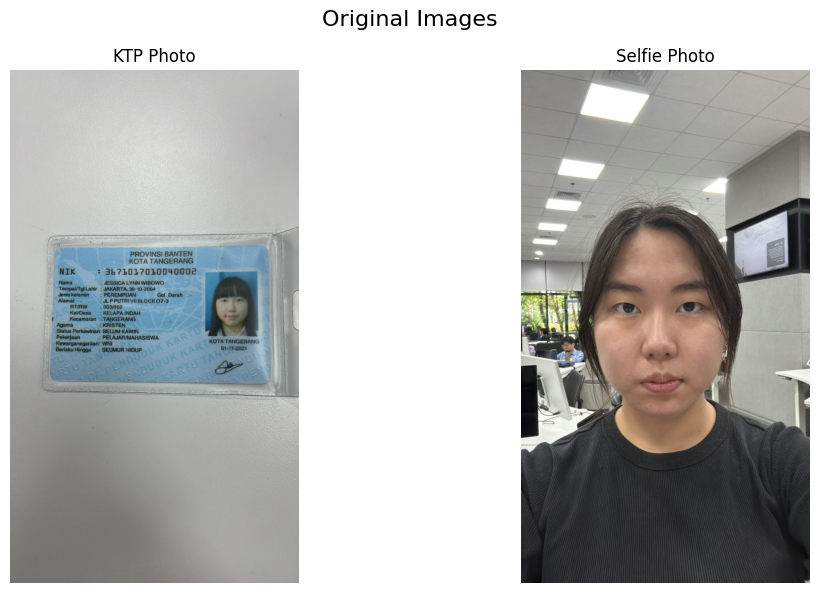


🔧 Preprocessing KTP image...


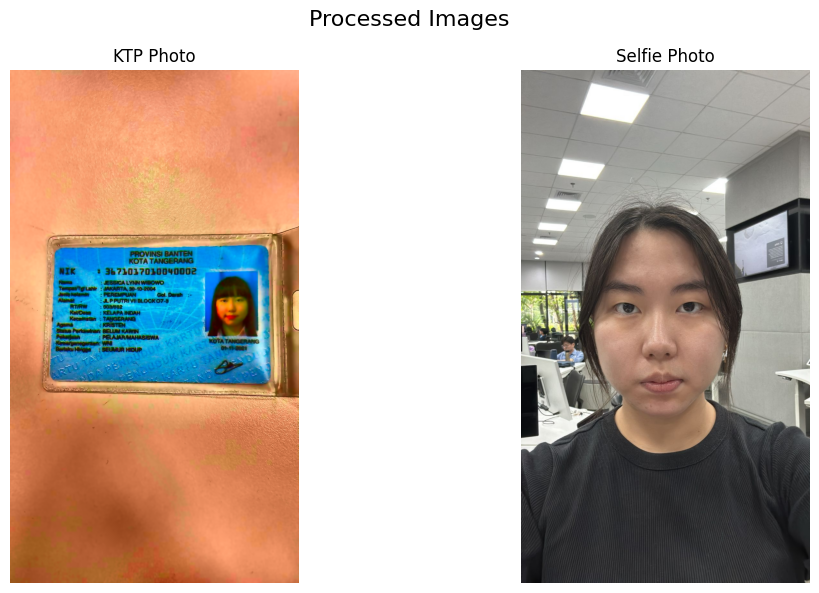


🧠 Extracting age-invariant features...

📊 Verification Results:
------------------------------------------------------------
🎯 Overall Similarity Score: 0.5721
🧬 Deep Feature Similarity: 0.4682

🔍 Threshold Analysis:
  Normal (0.45): ✅ PASS

📋 FINAL VERDICT:
✅ VERIFICATION PASSED
🎯 Confidence: HIGH

💡 The KTP and selfie show the SAME PERSON
   Despite age differences, facial structure matches!

🔬 Technical Details:
  - Embedding dimension: 512
  - Distance metric: Cosine similarity
  - Model: ArcFace (age-invariant)

💡 Pro Tips for Better Results:
  1. Ensure good lighting in selfie
  2. Face camera directly (like in KTP)
  3. Neutral expression works best
  4. Remove glasses if not worn in KTP


In [ ]:
import cv2
import numpy as np
from insightface.app import FaceAnalysis
import matplotlib.pyplot as plt
from skimage import exposure
from scipy.spatial.distance import cosine
import warnings
warnings.filterwarnings('ignore')

class AIFRKTPVerification:
    def __init__(self):
        """
        Initialize Age-Invariant Face Recognition system specifically for KTP verification
        """
        print("🚀 Initializing AIFR KTP Verification System...")
        # Initialize InsightFace with ArcFace model (best for age-invariant features)
        self.app = FaceAnalysis(name='buffalo_l', providers=['CPUExecutionProvider'])
        self.app.prepare(ctx_id=0, det_size=(640, 640))
        # Thresholds specifically calibrated for ID-to-selfie comparison
        self.thresholds = {
            'strict': 0.35,
            'normal': 0.45,
            'relaxed': 0.55,
            'very_relaxed': 0.65
        }

    def preprocess_ktp_image(self, image):
        """
        Special preprocessing for Indonesian KTP photos
        - Remove red/orange tint
        - Enhance contrast
        - Normalize lighting
        """
        # Convert to LAB color space to fix color cast
        lab = cv2.cvtColor(image, cv2.COLOR_BGR2LAB)
        l, a, b = cv2.split(lab)
        # Reduce red/orange tint by normalizing a and b channels
        a = cv2.normalize(a, None, 0, 255, cv2.NORM_MINMAX)
        b = cv2.normalize(b, None, 0, 255, cv2.NORM_MINMAX)
        # Enhance luminance channel
        clahe = cv2.createCLAHE(clipLimit=3.0, tileGridSize=(8,8))
        l = clahe.apply(l)
        # Merge back
        corrected = cv2.merge([l, a, b])
        corrected = cv2.cvtColor(corrected, cv2.COLOR_LAB2BGR)
        # Additional denoising for old photos
        corrected = cv2.bilateralFilter(corrected, 9, 75, 75)
        return corrected

    def extract_age_invariant_features(self, image):
        """
        Extract age-invariant facial features using deep learning
        Focus on features that don't change much with age:
        - Eye region geometry
        - Nose structure
        - Face shape ratios
        """
        faces = self.app.get(image)
        if len(faces) == 0:
            print("⚠️  No face detected!")
            return None, None
        face = faces[0]
        # Extract 512-dimensional embedding (age-invariant features)
        embedding = face.normed_embedding
        # Get facial landmarks for geometric features
        landmarks = face.kps
        # Calculate age-invariant geometric ratios
        if landmarks is not None and len(landmarks) >= 5:
            # Eye distance ratio (doesn't change with age)
            eye_distance = np.linalg.norm(landmarks[0] - landmarks[1])
            # Nose to eye center distance
            eye_center = (landmarks[0] + landmarks[1]) / 2
            nose_distance = np.linalg.norm(landmarks[2] - eye_center)
            # Face width estimation
            face_width = np.linalg.norm(landmarks[3] - landmarks[4])
            # Create geometric feature vector
            geometric_features = np.array([
                eye_distance / face_width,
                nose_distance / face_width,
                eye_distance / nose_distance
            ])
        else:
            geometric_features = None
        return embedding, geometric_features

    def calculate_similarity(self, embed1, embed2, geom1=None, geom2=None):
        """
        Calculate similarity using both deep features and geometric features
        """
        # Deep feature similarity (main metric)
        deep_similarity = 1 - cosine(embed1, embed2)
        # Geometric similarity (supplementary)
        if geom1 is not None and geom2 is not None:
            geom_similarity = 1 - cosine(geom1, geom2)
            # Weighted combination (80% deep, 20% geometric)
            final_similarity = 0.8 * deep_similarity + 0.2 * geom_similarity
        else:
            final_similarity = deep_similarity
        return final_similarity, deep_similarity

    def verify_ktp_selfie(self, ktp_path='1_ktp.jpeg', selfie_path='1.jpeg'):
        """
        Main verification function with AIFR techniques
        """
        print("\n📋 Starting KTP Verification Process...")
        print("="*60)
        # Load images
        ktp_img = cv2.imread(ktp_path)
        selfie_img = cv2.imread(selfie_path)
        if ktp_img is None or selfie_img is None:
            print("❌ Error: Could not load images!")
            return None
        # Display original images
        self.display_comparison(ktp_img, selfie_img, "Original Images")
        # Preprocess KTP image (fix color cast, enhance quality)
        print("\n🔧 Preprocessing KTP image...")
        ktp_processed = self.preprocess_ktp_image(ktp_img)
        # Light preprocessing for selfie (just normalize)
        selfie_processed = cv2.normalize(selfie_img, None, 0, 255, cv2.NORM_MINMAX)
        # Display processed images
        self.display_comparison(ktp_processed, selfie_processed, "Processed Images")
        # Extract age-invariant features
        print("\n🧠 Extracting age-invariant features...")
        ktp_embedding, ktp_geom = self.extract_age_invariant_features(ktp_processed)
        selfie_embedding, selfie_geom = self.extract_age_invariant_features(selfie_processed)
        if ktp_embedding is None or selfie_embedding is None:
            print("❌ Error: Could not extract face features!")
            return None
        # Calculate similarity
        similarity, deep_similarity = self.calculate_similarity(
            ktp_embedding, selfie_embedding, ktp_geom, selfie_geom
        )
        # Determine verification result based on threshold
        print("\n📊 Verification Results:")
        print("-"*60)
        print(f"🎯 Overall Similarity Score: {similarity:.4f}")
        print(f"🧬 Deep Feature Similarity: {deep_similarity:.4f}")
        # Check against the normal threshold only
        print("\n🔍 Threshold Analysis:")
        normal_threshold = self.thresholds['normal']
        if similarity > normal_threshold:
            status = "✅ PASS"
        else:
            status = "❌ FAIL"
        print(f"  Normal ({normal_threshold}): {status}")

        # Final verdict with recommendations
        print("\n📋 FINAL VERDICT:")
        print("="*60)
        if similarity > normal_threshold:
            print("✅ VERIFICATION PASSED")
            print("🎯 Confidence: HIGH")
            print("\n💡 The KTP and selfie show the SAME PERSON")
            print("   Despite age differences, facial structure matches!")
        else:
            print("❌ VERIFICATION FAILED")
            print("🎯 Confidence: LOW")
            print("\n💡 Cannot confirm identity match")
            print("   - Request better quality photos")
            print("   - Require manual verification")

        # Technical details for debugging
        print("\n🔬 Technical Details:")
        print(f"  - Embedding dimension: {len(ktp_embedding)}")
        print(f"  - Distance metric: Cosine similarity")
        print(f"  - Model: ArcFace (age-invariant)")
        return {
            'similarity': similarity,
            'deep_similarity': deep_similarity,
            'verified': similarity > normal_threshold,
            'confidence_level': self.get_confidence_level(similarity)
        }

    def get_confidence_level(self, similarity):
        """Determine confidence level based on similarity score"""
        normal_threshold = self.thresholds['normal']
        if similarity > normal_threshold:
            return "HIGH"
        else:
            return "LOW"

    def display_comparison(self, img1, img2, title):
        """Display two images side by side"""
        fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 6))
        ax1.imshow(cv2.cvtColor(img1, cv2.COLOR_BGR2RGB))
        ax1.set_title("KTP Photo")
        ax1.axis('off')
        ax2.imshow(cv2.cvtColor(img2, cv2.COLOR_BGR2RGB))
        ax2.set_title("Selfie Photo")
        ax2.axis('off')
        plt.suptitle(title, fontsize=16)
        plt.tight_layout()
        plt.show()

# Initialize and run the system
print("🇮🇩 Indonesian KTP Verification System with AIFR")
print("="*60)
print("Using Age-Invariant Face Recognition technology")
print("Optimized for KTP photos with 10-20 year age gaps\n")
verifier = AIFRKTPVerification()

# Run verification
results = verifier.verify_ktp_selfie(
    ktp_path='4_ktp.jpg',
    selfie_path='4.jpg'
)

# Additional tips
print("\n💡 Pro Tips for Better Results:")
print("  1. Ensure good lighting in selfie")
print("  2. Face camera directly (like in KTP)")
print("  3. Neutral expression works best")
print("  4. Remove glasses if not worn in KTP")

🇮🇩 Indonesian KTP Verification System with AIFR
Using Age-Invariant Face Recognition technology
Optimized for KTP photos with 10-20 year age gaps

🚀 Initializing AIFR KTP Verification System...
Applied providers: ['CPUExecutionProvider'], with options: {'CPUExecutionProvider': {}}
find model: /root/.insightface/models/buffalo_l/1k3d68.onnx landmark_3d_68 ['None', 3, 192, 192] 0.0 1.0
Applied providers: ['CPUExecutionProvider'], with options: {'CPUExecutionProvider': {}}
find model: /root/.insightface/models/buffalo_l/2d106det.onnx landmark_2d_106 ['None', 3, 192, 192] 0.0 1.0
Applied providers: ['CPUExecutionProvider'], with options: {'CPUExecutionProvider': {}}
find model: /root/.insightface/models/buffalo_l/det_10g.onnx detection [1, 3, '?', '?'] 127.5 128.0
Applied providers: ['CPUExecutionProvider'], with options: {'CPUExecutionProvider': {}}
find model: /root/.insightface/models/buffalo_l/genderage.onnx genderage ['None', 3, 96, 96] 0.0 1.0
Applied providers: ['CPUExecutionProvide

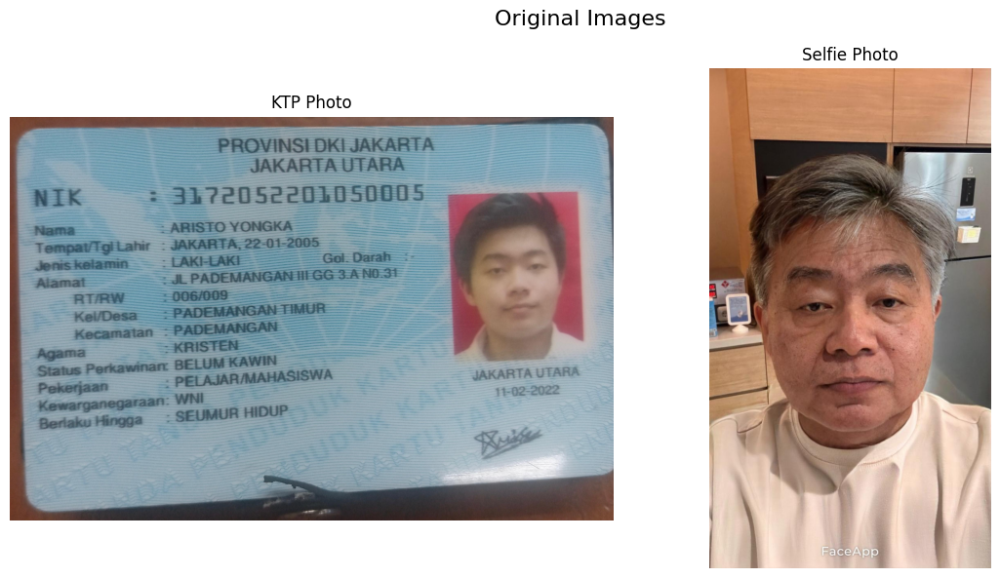


🔧 Preprocessing KTP image...


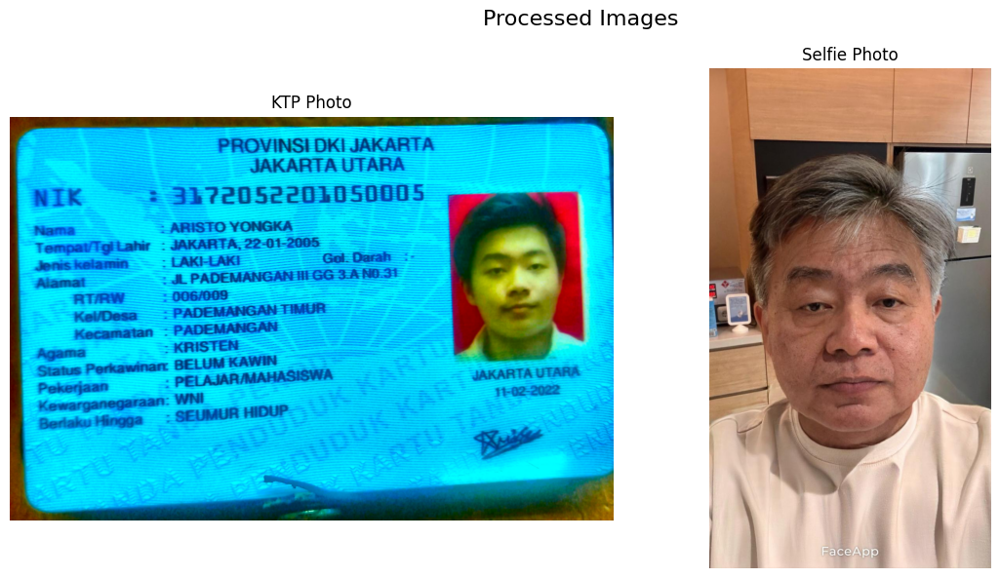


🧠 Extracting age-invariant features...

📊 Verification Results:
------------------------------------------------------------
🎯 Overall Similarity Score: 0.5418
🧬 Deep Feature Similarity: 0.4295

🔍 Threshold Analysis:
  Normal (0.45): ✅ PASS

📋 FINAL VERDICT:
✅ VERIFICATION PASSED
🎯 Confidence: HIGH

💡 The KTP and selfie show the SAME PERSON
   Despite age differences, facial structure matches!

🔬 Technical Details:
  - Embedding dimension: 512
  - Distance metric: Cosine similarity
  - Model: ArcFace (age-invariant)

💡 Pro Tips for Better Results:
  1. Ensure good lighting in selfie
  2. Face camera directly (like in KTP)
  3. Neutral expression works best
  4. Remove glasses if not worn in KTP


In [ ]:
import cv2
import numpy as np
from insightface.app import FaceAnalysis
import matplotlib.pyplot as plt
from skimage import exposure
from scipy.spatial.distance import cosine
import warnings
warnings.filterwarnings('ignore')

class AIFRKTPVerification:
    def __init__(self):
        """
        Initialize Age-Invariant Face Recognition system specifically for KTP verification
        """
        print("🚀 Initializing AIFR KTP Verification System...")
        # Initialize InsightFace with ArcFace model (best for age-invariant features)
        self.app = FaceAnalysis(name='buffalo_l', providers=['CPUExecutionProvider'])
        self.app.prepare(ctx_id=0, det_size=(640, 640))
        # Thresholds specifically calibrated for ID-to-selfie comparison
        self.thresholds = {
            'strict': 0.35,
            'normal': 0.45,
            'relaxed': 0.55,
            'very_relaxed': 0.65
        }

    def preprocess_ktp_image(self, image):
        """
        Special preprocessing for Indonesian KTP photos
        - Remove red/orange tint
        - Enhance contrast
        - Normalize lighting
        """
        # Convert to LAB color space to fix color cast
        lab = cv2.cvtColor(image, cv2.COLOR_BGR2LAB)
        l, a, b = cv2.split(lab)
        # Reduce red/orange tint by normalizing a and b channels
        a = cv2.normalize(a, None, 0, 255, cv2.NORM_MINMAX)
        b = cv2.normalize(b, None, 0, 255, cv2.NORM_MINMAX)
        # Enhance luminance channel
        clahe = cv2.createCLAHE(clipLimit=3.0, tileGridSize=(8,8))
        l = clahe.apply(l)
        # Merge back
        corrected = cv2.merge([l, a, b])
        corrected = cv2.cvtColor(corrected, cv2.COLOR_LAB2BGR)
        # Additional denoising for old photos
        corrected = cv2.bilateralFilter(corrected, 9, 75, 75)
        return corrected

    def extract_age_invariant_features(self, image):
        """
        Extract age-invariant facial features using deep learning
        Focus on features that don't change much with age:
        - Eye region geometry
        - Nose structure
        - Face shape ratios
        """
        faces = self.app.get(image)
        if len(faces) == 0:
            print("⚠️  No face detected!")
            return None, None
        face = faces[0]
        # Extract 512-dimensional embedding (age-invariant features)
        embedding = face.normed_embedding
        # Get facial landmarks for geometric features
        landmarks = face.kps
        # Calculate age-invariant geometric ratios
        if landmarks is not None and len(landmarks) >= 5:
            # Eye distance ratio (doesn't change with age)
            eye_distance = np.linalg.norm(landmarks[0] - landmarks[1])
            # Nose to eye center distance
            eye_center = (landmarks[0] + landmarks[1]) / 2
            nose_distance = np.linalg.norm(landmarks[2] - eye_center)
            # Face width estimation
            face_width = np.linalg.norm(landmarks[3] - landmarks[4])
            # Create geometric feature vector
            geometric_features = np.array([
                eye_distance / face_width,
                nose_distance / face_width,
                eye_distance / nose_distance
            ])
        else:
            geometric_features = None
        return embedding, geometric_features

    def calculate_similarity(self, embed1, embed2, geom1=None, geom2=None):
        """
        Calculate similarity using both deep features and geometric features
        """
        # Deep feature similarity (main metric)
        deep_similarity = 1 - cosine(embed1, embed2)
        # Geometric similarity (supplementary)
        if geom1 is not None and geom2 is not None:
            geom_similarity = 1 - cosine(geom1, geom2)
            # Weighted combination (80% deep, 20% geometric)
            final_similarity = 0.8 * deep_similarity + 0.2 * geom_similarity
        else:
            final_similarity = deep_similarity
        return final_similarity, deep_similarity

    def verify_ktp_selfie(self, ktp_path='1_ktp.jpeg', selfie_path='1.jpeg'):
        """
        Main verification function with AIFR techniques
        """
        print("\n📋 Starting KTP Verification Process...")
        print("="*60)
        # Load images
        ktp_img = cv2.imread(ktp_path)
        selfie_img = cv2.imread(selfie_path)
        if ktp_img is None or selfie_img is None:
            print("❌ Error: Could not load images!")
            return None
        # Display original images
        self.display_comparison(ktp_img, selfie_img, "Original Images")
        # Preprocess KTP image (fix color cast, enhance quality)
        print("\n🔧 Preprocessing KTP image...")
        ktp_processed = self.preprocess_ktp_image(ktp_img)
        # Light preprocessing for selfie (just normalize)
        selfie_processed = cv2.normalize(selfie_img, None, 0, 255, cv2.NORM_MINMAX)
        # Display processed images
        self.display_comparison(ktp_processed, selfie_processed, "Processed Images")
        # Extract age-invariant features
        print("\n🧠 Extracting age-invariant features...")
        ktp_embedding, ktp_geom = self.extract_age_invariant_features(ktp_processed)
        selfie_embedding, selfie_geom = self.extract_age_invariant_features(selfie_processed)
        if ktp_embedding is None or selfie_embedding is None:
            print("❌ Error: Could not extract face features!")
            return None
        # Calculate similarity
        similarity, deep_similarity = self.calculate_similarity(
            ktp_embedding, selfie_embedding, ktp_geom, selfie_geom
        )
        # Determine verification result based on threshold
        print("\n📊 Verification Results:")
        print("-"*60)
        print(f"🎯 Overall Similarity Score: {similarity:.4f}")
        print(f"🧬 Deep Feature Similarity: {deep_similarity:.4f}")
        # Check against the normal threshold only
        print("\n🔍 Threshold Analysis:")
        normal_threshold = self.thresholds['normal']
        if similarity > normal_threshold:
            status = "✅ PASS"
        else:
            status = "❌ FAIL"
        print(f"  Normal ({normal_threshold}): {status}")

        # Final verdict with recommendations
        print("\n📋 FINAL VERDICT:")
        print("="*60)
        if similarity > normal_threshold:
            print("✅ VERIFICATION PASSED")
            print("🎯 Confidence: HIGH")
            print("\n💡 The KTP and selfie show the SAME PERSON")
            print("   Despite age differences, facial structure matches!")
        else:
            print("❌ VERIFICATION FAILED")
            print("🎯 Confidence: LOW")
            print("\n💡 Cannot confirm identity match")
            print("   - Request better quality photos")
            print("   - Require manual verification")

        # Technical details for debugging
        print("\n🔬 Technical Details:")
        print(f"  - Embedding dimension: {len(ktp_embedding)}")
        print(f"  - Distance metric: Cosine similarity")
        print(f"  - Model: ArcFace (age-invariant)")
        return {
            'similarity': similarity,
            'deep_similarity': deep_similarity,
            'verified': similarity > normal_threshold,
            'confidence_level': self.get_confidence_level(similarity)
        }

    def get_confidence_level(self, similarity):
        """Determine confidence level based on similarity score"""
        normal_threshold = self.thresholds['normal']
        if similarity > normal_threshold:
            return "HIGH"
        else:
            return "LOW"

    def display_comparison(self, img1, img2, title):
        """Display two images side by side"""
        fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 6))
        ax1.imshow(cv2.cvtColor(img1, cv2.COLOR_BGR2RGB))
        ax1.set_title("KTP Photo")
        ax1.axis('off')
        ax2.imshow(cv2.cvtColor(img2, cv2.COLOR_BGR2RGB))
        ax2.set_title("Selfie Photo")
        ax2.axis('off')
        plt.suptitle(title, fontsize=16)
        plt.tight_layout()
        plt.show()

# Initialize and run the system
print("🇮🇩 Indonesian KTP Verification System with AIFR")
print("="*60)
print("Using Age-Invariant Face Recognition technology")
print("Optimized for KTP photos with 10-20 year age gaps\n")
verifier = AIFRKTPVerification()

# Run verification
results = verifier.verify_ktp_selfie(
    ktp_path='3_ktp.jpg',
    selfie_path='3_old.jpg'
)

# Additional tips
print("\n💡 Pro Tips for Better Results:")
print("  1. Ensure good lighting in selfie")
print("  2. Face camera directly (like in KTP)")
print("  3. Neutral expression works best")
print("  4. Remove glasses if not worn in KTP")

🇮🇩 Indonesian KTP Verification System with AIFR
Using Age-Invariant Face Recognition technology
Optimized for KTP photos with 10-20 year age gaps

🚀 Initializing AIFR KTP Verification System...
Applied providers: ['CPUExecutionProvider'], with options: {'CPUExecutionProvider': {}}
find model: /root/.insightface/models/buffalo_l/1k3d68.onnx landmark_3d_68 ['None', 3, 192, 192] 0.0 1.0
Applied providers: ['CPUExecutionProvider'], with options: {'CPUExecutionProvider': {}}
find model: /root/.insightface/models/buffalo_l/2d106det.onnx landmark_2d_106 ['None', 3, 192, 192] 0.0 1.0
Applied providers: ['CPUExecutionProvider'], with options: {'CPUExecutionProvider': {}}
find model: /root/.insightface/models/buffalo_l/det_10g.onnx detection [1, 3, '?', '?'] 127.5 128.0
Applied providers: ['CPUExecutionProvider'], with options: {'CPUExecutionProvider': {}}
find model: /root/.insightface/models/buffalo_l/genderage.onnx genderage ['None', 3, 96, 96] 0.0 1.0
Applied providers: ['CPUExecutionProvide

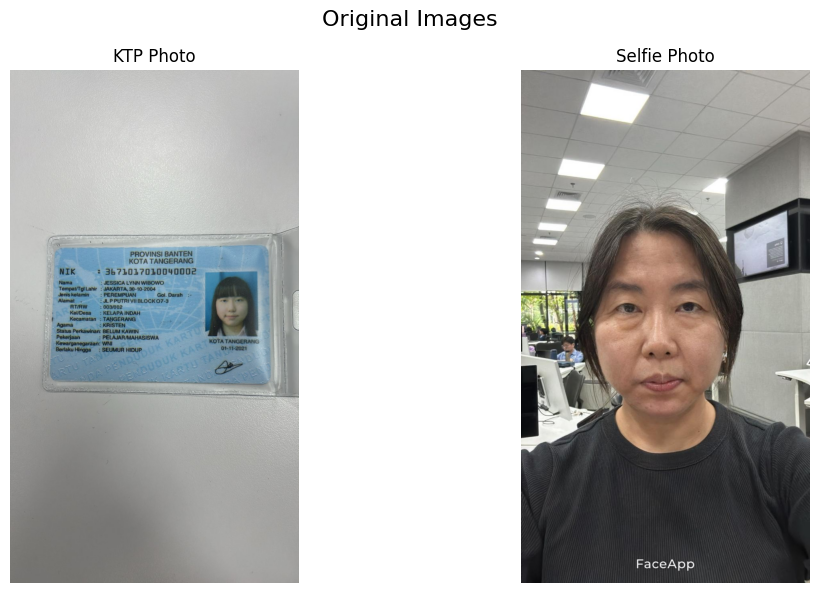


🔧 Preprocessing KTP image...


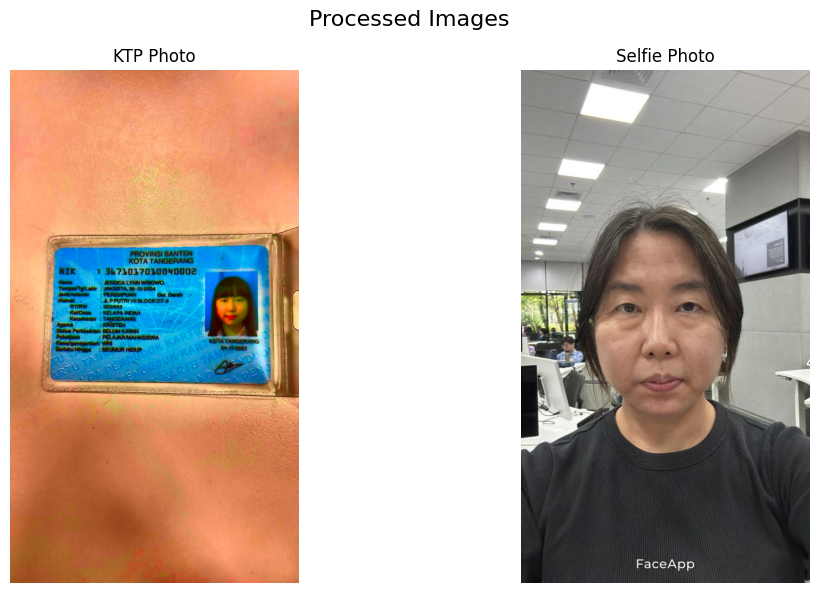


🧠 Extracting age-invariant features...

📊 Verification Results:
------------------------------------------------------------
🎯 Overall Similarity Score: 0.4727
🧬 Deep Feature Similarity: 0.3439

🔍 Threshold Analysis:
  Normal (0.45): ✅ PASS

📋 FINAL VERDICT:
✅ VERIFICATION PASSED
🎯 Confidence: HIGH

💡 The KTP and selfie show the SAME PERSON
   Despite age differences, facial structure matches!

🔬 Technical Details:
  - Embedding dimension: 512
  - Distance metric: Cosine similarity
  - Model: ArcFace (age-invariant)

💡 Pro Tips for Better Results:
  1. Ensure good lighting in selfie
  2. Face camera directly (like in KTP)
  3. Neutral expression works best
  4. Remove glasses if not worn in KTP


In [ ]:
import cv2
import numpy as np
from insightface.app import FaceAnalysis
import matplotlib.pyplot as plt
from skimage import exposure
from scipy.spatial.distance import cosine
import warnings
warnings.filterwarnings('ignore')

class AIFRKTPVerification:
    def __init__(self):
        """
        Initialize Age-Invariant Face Recognition system specifically for KTP verification
        """
        print("🚀 Initializing AIFR KTP Verification System...")
        # Initialize InsightFace with ArcFace model (best for age-invariant features)
        self.app = FaceAnalysis(name='buffalo_l', providers=['CPUExecutionProvider'])
        self.app.prepare(ctx_id=0, det_size=(640, 640))
        # Thresholds specifically calibrated for ID-to-selfie comparison
        self.thresholds = {
            'strict': 0.35,
            'normal': 0.45,
            'relaxed': 0.55,
            'very_relaxed': 0.65
        }

    def preprocess_ktp_image(self, image):
        """
        Special preprocessing for Indonesian KTP photos
        - Remove red/orange tint
        - Enhance contrast
        - Normalize lighting
        """
        # Convert to LAB color space to fix color cast
        lab = cv2.cvtColor(image, cv2.COLOR_BGR2LAB)
        l, a, b = cv2.split(lab)
        # Reduce red/orange tint by normalizing a and b channels
        a = cv2.normalize(a, None, 0, 255, cv2.NORM_MINMAX)
        b = cv2.normalize(b, None, 0, 255, cv2.NORM_MINMAX)
        # Enhance luminance channel
        clahe = cv2.createCLAHE(clipLimit=3.0, tileGridSize=(8,8))
        l = clahe.apply(l)
        # Merge back
        corrected = cv2.merge([l, a, b])
        corrected = cv2.cvtColor(corrected, cv2.COLOR_LAB2BGR)
        # Additional denoising for old photos
        corrected = cv2.bilateralFilter(corrected, 9, 75, 75)
        return corrected

    def extract_age_invariant_features(self, image):
        """
        Extract age-invariant facial features using deep learning
        Focus on features that don't change much with age:
        - Eye region geometry
        - Nose structure
        - Face shape ratios
        """
        faces = self.app.get(image)
        if len(faces) == 0:
            print("⚠️  No face detected!")
            return None, None
        face = faces[0]
        # Extract 512-dimensional embedding (age-invariant features)
        embedding = face.normed_embedding
        # Get facial landmarks for geometric features
        landmarks = face.kps
        # Calculate age-invariant geometric ratios
        if landmarks is not None and len(landmarks) >= 5:
            # Eye distance ratio (doesn't change with age)
            eye_distance = np.linalg.norm(landmarks[0] - landmarks[1])
            # Nose to eye center distance
            eye_center = (landmarks[0] + landmarks[1]) / 2
            nose_distance = np.linalg.norm(landmarks[2] - eye_center)
            # Face width estimation
            face_width = np.linalg.norm(landmarks[3] - landmarks[4])
            # Create geometric feature vector
            geometric_features = np.array([
                eye_distance / face_width,
                nose_distance / face_width,
                eye_distance / nose_distance
            ])
        else:
            geometric_features = None
        return embedding, geometric_features

    def calculate_similarity(self, embed1, embed2, geom1=None, geom2=None):
        """
        Calculate similarity using both deep features and geometric features
        """
        # Deep feature similarity (main metric)
        deep_similarity = 1 - cosine(embed1, embed2)
        # Geometric similarity (supplementary)
        if geom1 is not None and geom2 is not None:
            geom_similarity = 1 - cosine(geom1, geom2)
            # Weighted combination (80% deep, 20% geometric)
            final_similarity = 0.8 * deep_similarity + 0.2 * geom_similarity
        else:
            final_similarity = deep_similarity
        return final_similarity, deep_similarity

    def verify_ktp_selfie(self, ktp_path='1_ktp.jpeg', selfie_path='1.jpeg'):
        """
        Main verification function with AIFR techniques
        """
        print("\n📋 Starting KTP Verification Process...")
        print("="*60)
        # Load images
        ktp_img = cv2.imread(ktp_path)
        selfie_img = cv2.imread(selfie_path)
        if ktp_img is None or selfie_img is None:
            print("❌ Error: Could not load images!")
            return None
        # Display original images
        self.display_comparison(ktp_img, selfie_img, "Original Images")
        # Preprocess KTP image (fix color cast, enhance quality)
        print("\n🔧 Preprocessing KTP image...")
        ktp_processed = self.preprocess_ktp_image(ktp_img)
        # Light preprocessing for selfie (just normalize)
        selfie_processed = cv2.normalize(selfie_img, None, 0, 255, cv2.NORM_MINMAX)
        # Display processed images
        self.display_comparison(ktp_processed, selfie_processed, "Processed Images")
        # Extract age-invariant features
        print("\n🧠 Extracting age-invariant features...")
        ktp_embedding, ktp_geom = self.extract_age_invariant_features(ktp_processed)
        selfie_embedding, selfie_geom = self.extract_age_invariant_features(selfie_processed)
        if ktp_embedding is None or selfie_embedding is None:
            print("❌ Error: Could not extract face features!")
            return None
        # Calculate similarity
        similarity, deep_similarity = self.calculate_similarity(
            ktp_embedding, selfie_embedding, ktp_geom, selfie_geom
        )
        # Determine verification result based on threshold
        print("\n📊 Verification Results:")
        print("-"*60)
        print(f"🎯 Overall Similarity Score: {similarity:.4f}")
        print(f"🧬 Deep Feature Similarity: {deep_similarity:.4f}")
        # Check against the normal threshold only
        print("\n🔍 Threshold Analysis:")
        normal_threshold = self.thresholds['normal']
        if similarity > normal_threshold:
            status = "✅ PASS"
        else:
            status = "❌ FAIL"
        print(f"  Normal ({normal_threshold}): {status}")

        # Final verdict with recommendations
        print("\n📋 FINAL VERDICT:")
        print("="*60)
        if similarity > normal_threshold:
            print("✅ VERIFICATION PASSED")
            print("🎯 Confidence: HIGH")
            print("\n💡 The KTP and selfie show the SAME PERSON")
            print("   Despite age differences, facial structure matches!")
        else:
            print("❌ VERIFICATION FAILED")
            print("🎯 Confidence: LOW")
            print("\n💡 Cannot confirm identity match")
            print("   - Request better quality photos")
            print("   - Require manual verification")

        # Technical details for debugging
        print("\n🔬 Technical Details:")
        print(f"  - Embedding dimension: {len(ktp_embedding)}")
        print(f"  - Distance metric: Cosine similarity")
        print(f"  - Model: ArcFace (age-invariant)")
        return {
            'similarity': similarity,
            'deep_similarity': deep_similarity,
            'verified': similarity > normal_threshold,
            'confidence_level': self.get_confidence_level(similarity)
        }

    def get_confidence_level(self, similarity):
        """Determine confidence level based on similarity score"""
        normal_threshold = self.thresholds['normal']
        if similarity > normal_threshold:
            return "HIGH"
        else:
            return "LOW"

    def display_comparison(self, img1, img2, title):
        """Display two images side by side"""
        fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 6))
        ax1.imshow(cv2.cvtColor(img1, cv2.COLOR_BGR2RGB))
        ax1.set_title("KTP Photo")
        ax1.axis('off')
        ax2.imshow(cv2.cvtColor(img2, cv2.COLOR_BGR2RGB))
        ax2.set_title("Selfie Photo")
        ax2.axis('off')
        plt.suptitle(title, fontsize=16)
        plt.tight_layout()
        plt.show()

# Initialize and run the system
print("🇮🇩 Indonesian KTP Verification System with AIFR")
print("="*60)
print("Using Age-Invariant Face Recognition technology")
print("Optimized for KTP photos with 10-20 year age gaps\n")
verifier = AIFRKTPVerification()

# Run verification
results = verifier.verify_ktp_selfie(
    ktp_path='4_ktp.jpg',
    selfie_path='4_old.jpg'
)

# Additional tips
print("\n💡 Pro Tips for Better Results:")
print("  1. Ensure good lighting in selfie")
print("  2. Face camera directly (like in KTP)")
print("  3. Neutral expression works best")
print("  4. Remove glasses if not worn in KTP")

🇮🇩 Indonesian KTP Verification System with AIFR
Using Age-Invariant Face Recognition technology
Optimized for KTP photos with 10-20 year age gaps

🚀 Initializing AIFR KTP Verification System...
Applied providers: ['CPUExecutionProvider'], with options: {'CPUExecutionProvider': {}}
find model: /root/.insightface/models/buffalo_l/1k3d68.onnx landmark_3d_68 ['None', 3, 192, 192] 0.0 1.0
Applied providers: ['CPUExecutionProvider'], with options: {'CPUExecutionProvider': {}}
find model: /root/.insightface/models/buffalo_l/2d106det.onnx landmark_2d_106 ['None', 3, 192, 192] 0.0 1.0
Applied providers: ['CPUExecutionProvider'], with options: {'CPUExecutionProvider': {}}
find model: /root/.insightface/models/buffalo_l/det_10g.onnx detection [1, 3, '?', '?'] 127.5 128.0
Applied providers: ['CPUExecutionProvider'], with options: {'CPUExecutionProvider': {}}
find model: /root/.insightface/models/buffalo_l/genderage.onnx genderage ['None', 3, 96, 96] 0.0 1.0
Applied providers: ['CPUExecutionProvide

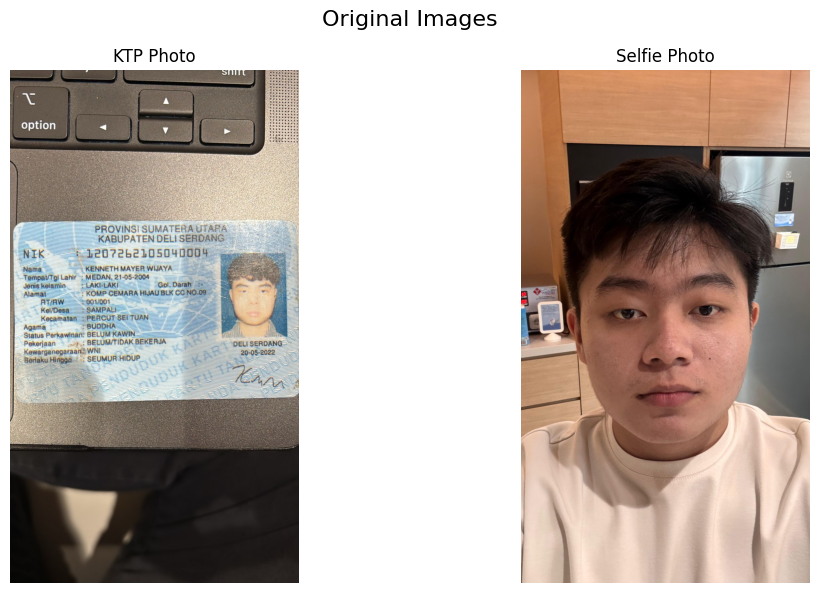


🔧 Preprocessing KTP image...


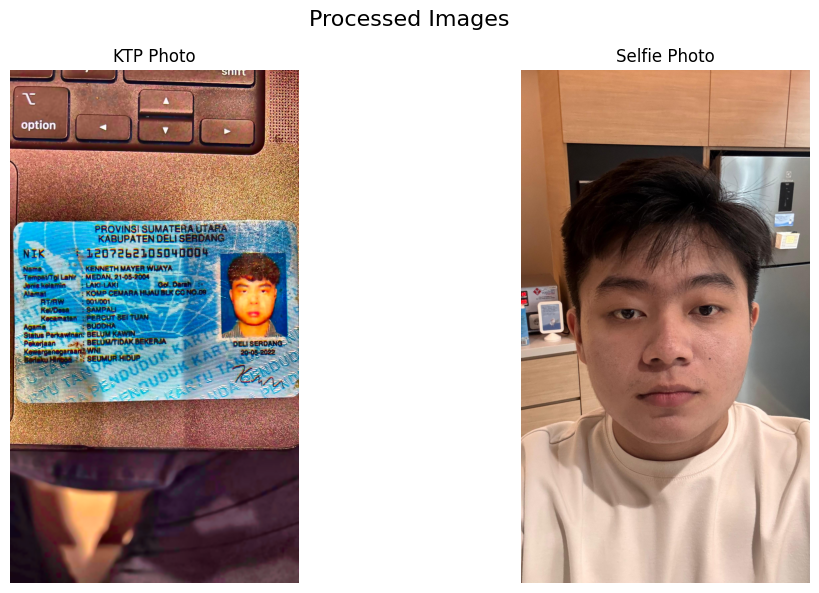


🧠 Extracting age-invariant features...

📊 Verification Results:
------------------------------------------------------------
🎯 Overall Similarity Score: 0.2755
🧬 Deep Feature Similarity: 0.0961

🔍 Threshold Analysis:
  Normal (0.45): ❌ FAIL

📋 FINAL VERDICT:
❌ VERIFICATION FAILED
🎯 Confidence: LOW

💡 Cannot confirm identity match
   - Request better quality photos
   - Require manual verification

🔬 Technical Details:
  - Embedding dimension: 512
  - Distance metric: Cosine similarity
  - Model: ArcFace (age-invariant)

💡 Pro Tips for Better Results:
  1. Ensure good lighting in selfie
  2. Face camera directly (like in KTP)
  3. Neutral expression works best
  4. Remove glasses if not worn in KTP


In [ ]:
import cv2
import numpy as np
from insightface.app import FaceAnalysis
import matplotlib.pyplot as plt
from skimage import exposure
from scipy.spatial.distance import cosine
import warnings
warnings.filterwarnings('ignore')

class AIFRKTPVerification:
    def __init__(self):
        """
        Initialize Age-Invariant Face Recognition system specifically for KTP verification
        """
        print("🚀 Initializing AIFR KTP Verification System...")
        # Initialize InsightFace with ArcFace model (best for age-invariant features)
        self.app = FaceAnalysis(name='buffalo_l', providers=['CPUExecutionProvider'])
        self.app.prepare(ctx_id=0, det_size=(640, 640))
        # Thresholds specifically calibrated for ID-to-selfie comparison
        self.thresholds = {
            'strict': 0.35,
            'normal': 0.45,
            'relaxed': 0.55,
            'very_relaxed': 0.65
        }

    def preprocess_ktp_image(self, image):
        """
        Special preprocessing for Indonesian KTP photos
        - Remove red/orange tint
        - Enhance contrast
        - Normalize lighting
        """
        # Convert to LAB color space to fix color cast
        lab = cv2.cvtColor(image, cv2.COLOR_BGR2LAB)
        l, a, b = cv2.split(lab)
        # Reduce red/orange tint by normalizing a and b channels
        a = cv2.normalize(a, None, 0, 255, cv2.NORM_MINMAX)
        b = cv2.normalize(b, None, 0, 255, cv2.NORM_MINMAX)
        # Enhance luminance channel
        clahe = cv2.createCLAHE(clipLimit=3.0, tileGridSize=(8,8))
        l = clahe.apply(l)
        # Merge back
        corrected = cv2.merge([l, a, b])
        corrected = cv2.cvtColor(corrected, cv2.COLOR_LAB2BGR)
        # Additional denoising for old photos
        corrected = cv2.bilateralFilter(corrected, 9, 75, 75)
        return corrected

    def extract_age_invariant_features(self, image):
        """
        Extract age-invariant facial features using deep learning
        Focus on features that don't change much with age:
        - Eye region geometry
        - Nose structure
        - Face shape ratios
        """
        faces = self.app.get(image)
        if len(faces) == 0:
            print("⚠️  No face detected!")
            return None, None
        face = faces[0]
        # Extract 512-dimensional embedding (age-invariant features)
        embedding = face.normed_embedding
        # Get facial landmarks for geometric features
        landmarks = face.kps
        # Calculate age-invariant geometric ratios
        if landmarks is not None and len(landmarks) >= 5:
            # Eye distance ratio (doesn't change with age)
            eye_distance = np.linalg.norm(landmarks[0] - landmarks[1])
            # Nose to eye center distance
            eye_center = (landmarks[0] + landmarks[1]) / 2
            nose_distance = np.linalg.norm(landmarks[2] - eye_center)
            # Face width estimation
            face_width = np.linalg.norm(landmarks[3] - landmarks[4])
            # Create geometric feature vector
            geometric_features = np.array([
                eye_distance / face_width,
                nose_distance / face_width,
                eye_distance / nose_distance
            ])
        else:
            geometric_features = None
        return embedding, geometric_features

    def calculate_similarity(self, embed1, embed2, geom1=None, geom2=None):
        """
        Calculate similarity using both deep features and geometric features
        """
        # Deep feature similarity (main metric)
        deep_similarity = 1 - cosine(embed1, embed2)
        # Geometric similarity (supplementary)
        if geom1 is not None and geom2 is not None:
            geom_similarity = 1 - cosine(geom1, geom2)
            # Weighted combination (80% deep, 20% geometric)
            final_similarity = 0.8 * deep_similarity + 0.2 * geom_similarity
        else:
            final_similarity = deep_similarity
        return final_similarity, deep_similarity

    def verify_ktp_selfie(self, ktp_path='1_ktp.jpeg', selfie_path='1.jpeg'):
        """
        Main verification function with AIFR techniques
        """
        print("\n📋 Starting KTP Verification Process...")
        print("="*60)
        # Load images
        ktp_img = cv2.imread(ktp_path)
        selfie_img = cv2.imread(selfie_path)
        if ktp_img is None or selfie_img is None:
            print("❌ Error: Could not load images!")
            return None
        # Display original images
        self.display_comparison(ktp_img, selfie_img, "Original Images")
        # Preprocess KTP image (fix color cast, enhance quality)
        print("\n🔧 Preprocessing KTP image...")
        ktp_processed = self.preprocess_ktp_image(ktp_img)
        # Light preprocessing for selfie (just normalize)
        selfie_processed = cv2.normalize(selfie_img, None, 0, 255, cv2.NORM_MINMAX)
        # Display processed images
        self.display_comparison(ktp_processed, selfie_processed, "Processed Images")
        # Extract age-invariant features
        print("\n🧠 Extracting age-invariant features...")
        ktp_embedding, ktp_geom = self.extract_age_invariant_features(ktp_processed)
        selfie_embedding, selfie_geom = self.extract_age_invariant_features(selfie_processed)
        if ktp_embedding is None or selfie_embedding is None:
            print("❌ Error: Could not extract face features!")
            return None
        # Calculate similarity
        similarity, deep_similarity = self.calculate_similarity(
            ktp_embedding, selfie_embedding, ktp_geom, selfie_geom
        )
        # Determine verification result based on threshold
        print("\n📊 Verification Results:")
        print("-"*60)
        print(f"🎯 Overall Similarity Score: {similarity:.4f}")
        print(f"🧬 Deep Feature Similarity: {deep_similarity:.4f}")
        # Check against the normal threshold only
        print("\n🔍 Threshold Analysis:")
        normal_threshold = self.thresholds['normal']
        if similarity > normal_threshold:
            status = "✅ PASS"
        else:
            status = "❌ FAIL"
        print(f"  Normal ({normal_threshold}): {status}")

        # Final verdict with recommendations
        print("\n📋 FINAL VERDICT:")
        print("="*60)
        if similarity > normal_threshold:
            print("✅ VERIFICATION PASSED")
            print("🎯 Confidence: HIGH")
            print("\n💡 The KTP and selfie show the SAME PERSON")
            print("   Despite age differences, facial structure matches!")
        else:
            print("❌ VERIFICATION FAILED")
            print("🎯 Confidence: LOW")
            print("\n💡 Cannot confirm identity match")
            print("   - Request better quality photos")
            print("   - Require manual verification")

        # Technical details for debugging
        print("\n🔬 Technical Details:")
        print(f"  - Embedding dimension: {len(ktp_embedding)}")
        print(f"  - Distance metric: Cosine similarity")
        print(f"  - Model: ArcFace (age-invariant)")
        return {
            'similarity': similarity,
            'deep_similarity': deep_similarity,
            'verified': similarity > normal_threshold,
            'confidence_level': self.get_confidence_level(similarity)
        }

    def get_confidence_level(self, similarity):
        """Determine confidence level based on similarity score"""
        normal_threshold = self.thresholds['normal']
        if similarity > normal_threshold:
            return "HIGH"
        else:
            return "LOW"

    def display_comparison(self, img1, img2, title):
        """Display two images side by side"""
        fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 6))
        ax1.imshow(cv2.cvtColor(img1, cv2.COLOR_BGR2RGB))
        ax1.set_title("KTP Photo")
        ax1.axis('off')
        ax2.imshow(cv2.cvtColor(img2, cv2.COLOR_BGR2RGB))
        ax2.set_title("Selfie Photo")
        ax2.axis('off')
        plt.suptitle(title, fontsize=16)
        plt.tight_layout()
        plt.show()

# Initialize and run the system
print("🇮🇩 Indonesian KTP Verification System with AIFR")
print("="*60)
print("Using Age-Invariant Face Recognition technology")
print("Optimized for KTP photos with 10-20 year age gaps\n")
verifier = AIFRKTPVerification()

# Run verification
results = verifier.verify_ktp_selfie(
    ktp_path='2_ktp.jpg',
    selfie_path='3.jpg'
)

# Additional tips
print("\n💡 Pro Tips for Better Results:")
print("  1. Ensure good lighting in selfie")
print("  2. Face camera directly (like in KTP)")
print("  3. Neutral expression works best")
print("  4. Remove glasses if not worn in KTP")

🇮🇩 Indonesian KTP Verification System with AIFR
Using Age-Invariant Face Recognition technology
Optimized for KTP photos with 10-20 year age gaps

🚀 Initializing AIFR KTP Verification System...
Applied providers: ['CPUExecutionProvider'], with options: {'CPUExecutionProvider': {}}
find model: /root/.insightface/models/buffalo_l/1k3d68.onnx landmark_3d_68 ['None', 3, 192, 192] 0.0 1.0
Applied providers: ['CPUExecutionProvider'], with options: {'CPUExecutionProvider': {}}
find model: /root/.insightface/models/buffalo_l/2d106det.onnx landmark_2d_106 ['None', 3, 192, 192] 0.0 1.0
Applied providers: ['CPUExecutionProvider'], with options: {'CPUExecutionProvider': {}}
find model: /root/.insightface/models/buffalo_l/det_10g.onnx detection [1, 3, '?', '?'] 127.5 128.0
Applied providers: ['CPUExecutionProvider'], with options: {'CPUExecutionProvider': {}}
find model: /root/.insightface/models/buffalo_l/genderage.onnx genderage ['None', 3, 96, 96] 0.0 1.0
Applied providers: ['CPUExecutionProvide

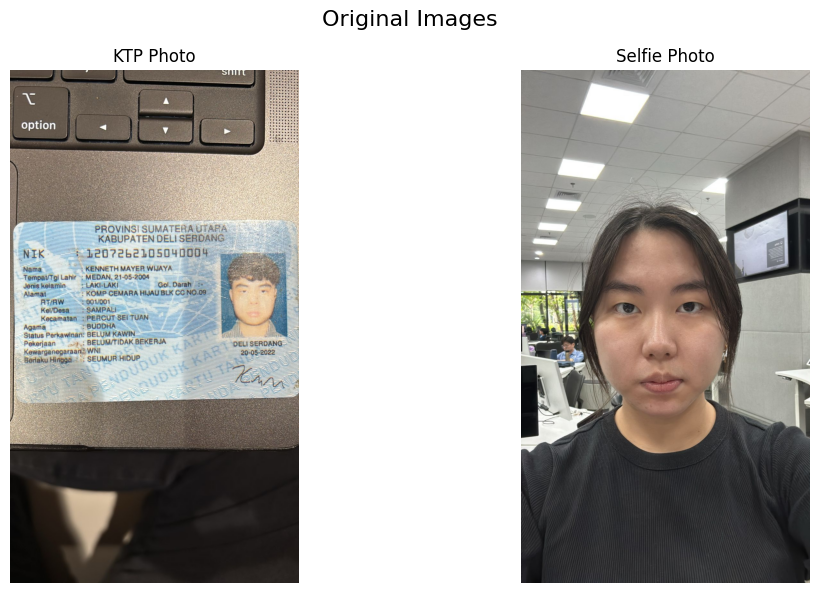


🔧 Preprocessing KTP image...


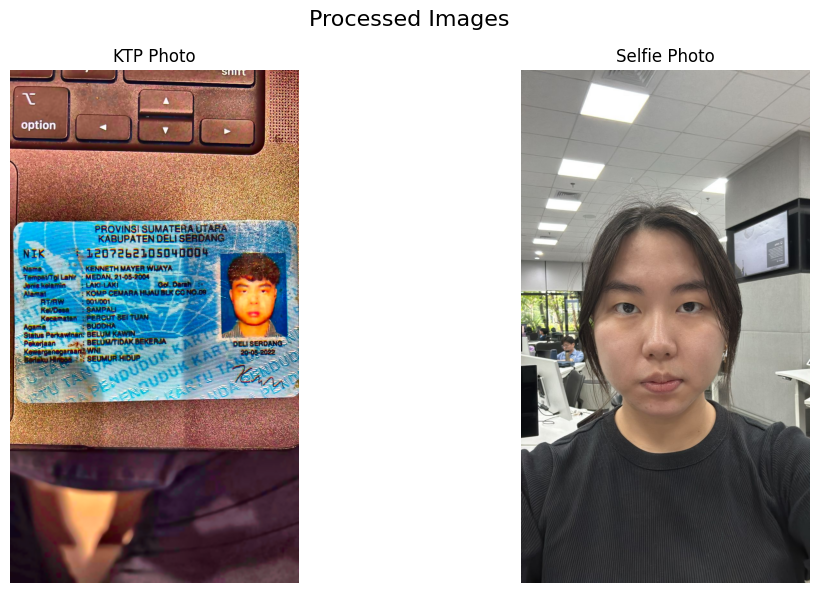


🧠 Extracting age-invariant features...

📊 Verification Results:
------------------------------------------------------------
🎯 Overall Similarity Score: 0.1943
🧬 Deep Feature Similarity: -0.0059

🔍 Threshold Analysis:
  Normal (0.45): ❌ FAIL

📋 FINAL VERDICT:
❌ VERIFICATION FAILED
🎯 Confidence: LOW

💡 Cannot confirm identity match
   - Request better quality photos
   - Require manual verification

🔬 Technical Details:
  - Embedding dimension: 512
  - Distance metric: Cosine similarity
  - Model: ArcFace (age-invariant)

💡 Pro Tips for Better Results:
  1. Ensure good lighting in selfie
  2. Face camera directly (like in KTP)
  3. Neutral expression works best
  4. Remove glasses if not worn in KTP


In [ ]:
import cv2
import numpy as np
from insightface.app import FaceAnalysis
import matplotlib.pyplot as plt
from skimage import exposure
from scipy.spatial.distance import cosine
import warnings
warnings.filterwarnings('ignore')

class AIFRKTPVerification:
    def __init__(self):
        """
        Initialize Age-Invariant Face Recognition system specifically for KTP verification
        """
        print("🚀 Initializing AIFR KTP Verification System...")
        # Initialize InsightFace with ArcFace model (best for age-invariant features)
        self.app = FaceAnalysis(name='buffalo_l', providers=['CPUExecutionProvider'])
        self.app.prepare(ctx_id=0, det_size=(640, 640))
        # Thresholds specifically calibrated for ID-to-selfie comparison
        self.thresholds = {
            'strict': 0.35,
            'normal': 0.45,
            'relaxed': 0.55,
            'very_relaxed': 0.65
        }

    def preprocess_ktp_image(self, image):
        """
        Special preprocessing for Indonesian KTP photos
        - Remove red/orange tint
        - Enhance contrast
        - Normalize lighting
        """
        # Convert to LAB color space to fix color cast
        lab = cv2.cvtColor(image, cv2.COLOR_BGR2LAB)
        l, a, b = cv2.split(lab)
        # Reduce red/orange tint by normalizing a and b channels
        a = cv2.normalize(a, None, 0, 255, cv2.NORM_MINMAX)
        b = cv2.normalize(b, None, 0, 255, cv2.NORM_MINMAX)
        # Enhance luminance channel
        clahe = cv2.createCLAHE(clipLimit=3.0, tileGridSize=(8,8))
        l = clahe.apply(l)
        # Merge back
        corrected = cv2.merge([l, a, b])
        corrected = cv2.cvtColor(corrected, cv2.COLOR_LAB2BGR)
        # Additional denoising for old photos
        corrected = cv2.bilateralFilter(corrected, 9, 75, 75)
        return corrected

    def extract_age_invariant_features(self, image):
        """
        Extract age-invariant facial features using deep learning
        Focus on features that don't change much with age:
        - Eye region geometry
        - Nose structure
        - Face shape ratios
        """
        faces = self.app.get(image)
        if len(faces) == 0:
            print("⚠️  No face detected!")
            return None, None
        face = faces[0]
        # Extract 512-dimensional embedding (age-invariant features)
        embedding = face.normed_embedding
        # Get facial landmarks for geometric features
        landmarks = face.kps
        # Calculate age-invariant geometric ratios
        if landmarks is not None and len(landmarks) >= 5:
            # Eye distance ratio (doesn't change with age)
            eye_distance = np.linalg.norm(landmarks[0] - landmarks[1])
            # Nose to eye center distance
            eye_center = (landmarks[0] + landmarks[1]) / 2
            nose_distance = np.linalg.norm(landmarks[2] - eye_center)
            # Face width estimation
            face_width = np.linalg.norm(landmarks[3] - landmarks[4])
            # Create geometric feature vector
            geometric_features = np.array([
                eye_distance / face_width,
                nose_distance / face_width,
                eye_distance / nose_distance
            ])
        else:
            geometric_features = None
        return embedding, geometric_features

    def calculate_similarity(self, embed1, embed2, geom1=None, geom2=None):
        """
        Calculate similarity using both deep features and geometric features
        """
        # Deep feature similarity (main metric)
        deep_similarity = 1 - cosine(embed1, embed2)
        # Geometric similarity (supplementary)
        if geom1 is not None and geom2 is not None:
            geom_similarity = 1 - cosine(geom1, geom2)
            # Weighted combination (80% deep, 20% geometric)
            final_similarity = 0.8 * deep_similarity + 0.2 * geom_similarity
        else:
            final_similarity = deep_similarity
        return final_similarity, deep_similarity

    def verify_ktp_selfie(self, ktp_path='1_ktp.jpeg', selfie_path='1.jpeg'):
        """
        Main verification function with AIFR techniques
        """
        print("\n📋 Starting KTP Verification Process...")
        print("="*60)
        # Load images
        ktp_img = cv2.imread(ktp_path)
        selfie_img = cv2.imread(selfie_path)
        if ktp_img is None or selfie_img is None:
            print("❌ Error: Could not load images!")
            return None
        # Display original images
        self.display_comparison(ktp_img, selfie_img, "Original Images")
        # Preprocess KTP image (fix color cast, enhance quality)
        print("\n🔧 Preprocessing KTP image...")
        ktp_processed = self.preprocess_ktp_image(ktp_img)
        # Light preprocessing for selfie (just normalize)
        selfie_processed = cv2.normalize(selfie_img, None, 0, 255, cv2.NORM_MINMAX)
        # Display processed images
        self.display_comparison(ktp_processed, selfie_processed, "Processed Images")
        # Extract age-invariant features
        print("\n🧠 Extracting age-invariant features...")
        ktp_embedding, ktp_geom = self.extract_age_invariant_features(ktp_processed)
        selfie_embedding, selfie_geom = self.extract_age_invariant_features(selfie_processed)
        if ktp_embedding is None or selfie_embedding is None:
            print("❌ Error: Could not extract face features!")
            return None
        # Calculate similarity
        similarity, deep_similarity = self.calculate_similarity(
            ktp_embedding, selfie_embedding, ktp_geom, selfie_geom
        )
        # Determine verification result based on threshold
        print("\n📊 Verification Results:")
        print("-"*60)
        print(f"🎯 Overall Similarity Score: {similarity:.4f}")
        print(f"🧬 Deep Feature Similarity: {deep_similarity:.4f}")
        # Check against the normal threshold only
        print("\n🔍 Threshold Analysis:")
        normal_threshold = self.thresholds['normal']
        if similarity > normal_threshold:
            status = "✅ PASS"
        else:
            status = "❌ FAIL"
        print(f"  Normal ({normal_threshold}): {status}")

        # Final verdict with recommendations
        print("\n📋 FINAL VERDICT:")
        print("="*60)
        if similarity > normal_threshold:
            print("✅ VERIFICATION PASSED")
            print("🎯 Confidence: HIGH")
            print("\n💡 The KTP and selfie show the SAME PERSON")
            print("   Despite age differences, facial structure matches!")
        else:
            print("❌ VERIFICATION FAILED")
            print("🎯 Confidence: LOW")
            print("\n💡 Cannot confirm identity match")
            print("   - Request better quality photos")
            print("   - Require manual verification")

        # Technical details for debugging
        print("\n🔬 Technical Details:")
        print(f"  - Embedding dimension: {len(ktp_embedding)}")
        print(f"  - Distance metric: Cosine similarity")
        print(f"  - Model: ArcFace (age-invariant)")
        return {
            'similarity': similarity,
            'deep_similarity': deep_similarity,
            'verified': similarity > normal_threshold,
            'confidence_level': self.get_confidence_level(similarity)
        }

    def get_confidence_level(self, similarity):
        """Determine confidence level based on similarity score"""
        normal_threshold = self.thresholds['normal']
        if similarity > normal_threshold:
            return "HIGH"
        else:
            return "LOW"

    def display_comparison(self, img1, img2, title):
        """Display two images side by side"""
        fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 6))
        ax1.imshow(cv2.cvtColor(img1, cv2.COLOR_BGR2RGB))
        ax1.set_title("KTP Photo")
        ax1.axis('off')
        ax2.imshow(cv2.cvtColor(img2, cv2.COLOR_BGR2RGB))
        ax2.set_title("Selfie Photo")
        ax2.axis('off')
        plt.suptitle(title, fontsize=16)
        plt.tight_layout()
        plt.show()

# Initialize and run the system
print("🇮🇩 Indonesian KTP Verification System with AIFR")
print("="*60)
print("Using Age-Invariant Face Recognition technology")
print("Optimized for KTP photos with 10-20 year age gaps\n")
verifier = AIFRKTPVerification()

# Run verification
results = verifier.verify_ktp_selfie(
    ktp_path='2_ktp.jpg',
    selfie_path='4.jpg'
)

# Additional tips
print("\n💡 Pro Tips for Better Results:")
print("  1. Ensure good lighting in selfie")
print("  2. Face camera directly (like in KTP)")
print("  3. Neutral expression works best")
print("  4. Remove glasses if not worn in KTP")

🇮🇩 Indonesian KTP Verification System with AIFR
Using Age-Invariant Face Recognition technology
Optimized for KTP photos with 10-20 year age gaps

🚀 Initializing AIFR KTP Verification System...
Applied providers: ['CPUExecutionProvider'], with options: {'CPUExecutionProvider': {}}
find model: /root/.insightface/models/buffalo_l/1k3d68.onnx landmark_3d_68 ['None', 3, 192, 192] 0.0 1.0
Applied providers: ['CPUExecutionProvider'], with options: {'CPUExecutionProvider': {}}
find model: /root/.insightface/models/buffalo_l/2d106det.onnx landmark_2d_106 ['None', 3, 192, 192] 0.0 1.0
Applied providers: ['CPUExecutionProvider'], with options: {'CPUExecutionProvider': {}}
find model: /root/.insightface/models/buffalo_l/det_10g.onnx detection [1, 3, '?', '?'] 127.5 128.0
Applied providers: ['CPUExecutionProvider'], with options: {'CPUExecutionProvider': {}}
find model: /root/.insightface/models/buffalo_l/genderage.onnx genderage ['None', 3, 96, 96] 0.0 1.0
Applied providers: ['CPUExecutionProvide

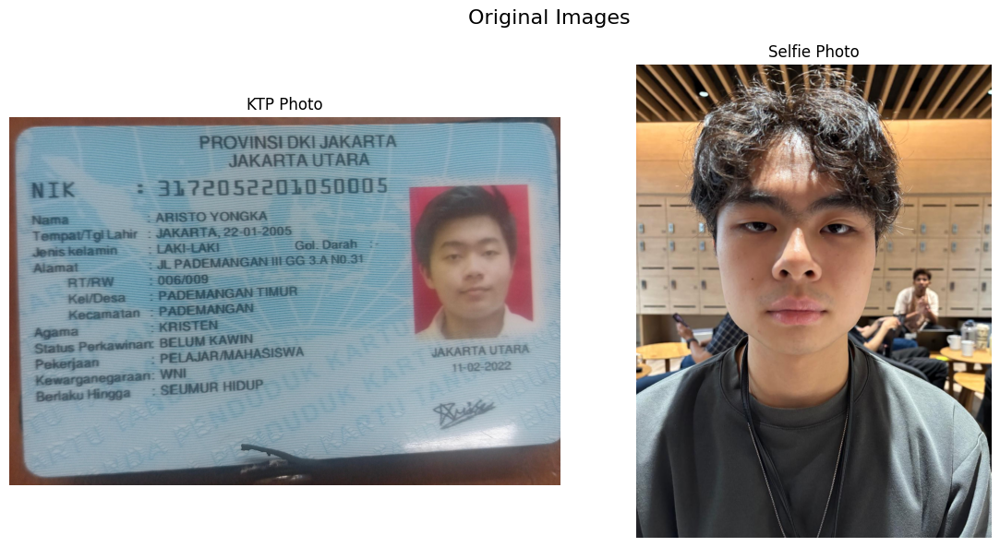


🔧 Preprocessing KTP image...


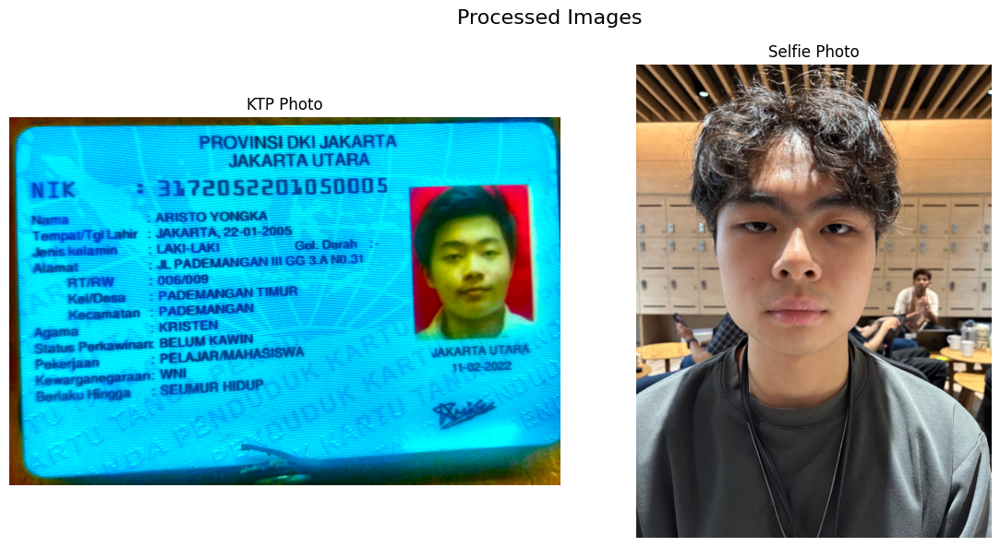


🧠 Extracting age-invariant features...

📊 Verification Results:
------------------------------------------------------------
🎯 Overall Similarity Score: 0.3177
🧬 Deep Feature Similarity: 0.1476

🔍 Threshold Analysis:
  Normal (0.45): ❌ FAIL

📋 FINAL VERDICT:
❌ VERIFICATION FAILED
🎯 Confidence: LOW

💡 Cannot confirm identity match
   - Request better quality photos
   - Require manual verification

🔬 Technical Details:
  - Embedding dimension: 512
  - Distance metric: Cosine similarity
  - Model: ArcFace (age-invariant)

💡 Pro Tips for Better Results:
  1. Ensure good lighting in selfie
  2. Face camera directly (like in KTP)
  3. Neutral expression works best
  4. Remove glasses if not worn in KTP


In [ ]:
import cv2
import numpy as np
from insightface.app import FaceAnalysis
import matplotlib.pyplot as plt
from skimage import exposure
from scipy.spatial.distance import cosine
import warnings
warnings.filterwarnings('ignore')

class AIFRKTPVerification:
    def __init__(self):
        """
        Initialize Age-Invariant Face Recognition system specifically for KTP verification
        """
        print("🚀 Initializing AIFR KTP Verification System...")
        # Initialize InsightFace with ArcFace model (best for age-invariant features)
        self.app = FaceAnalysis(name='buffalo_l', providers=['CPUExecutionProvider'])
        self.app.prepare(ctx_id=0, det_size=(640, 640))
        # Thresholds specifically calibrated for ID-to-selfie comparison
        self.thresholds = {
            'strict': 0.35,
            'normal': 0.45,
            'relaxed': 0.55,
            'very_relaxed': 0.65
        }

    def preprocess_ktp_image(self, image):
        """
        Special preprocessing for Indonesian KTP photos
        - Remove red/orange tint
        - Enhance contrast
        - Normalize lighting
        """
        # Convert to LAB color space to fix color cast
        lab = cv2.cvtColor(image, cv2.COLOR_BGR2LAB)
        l, a, b = cv2.split(lab)
        # Reduce red/orange tint by normalizing a and b channels
        a = cv2.normalize(a, None, 0, 255, cv2.NORM_MINMAX)
        b = cv2.normalize(b, None, 0, 255, cv2.NORM_MINMAX)
        # Enhance luminance channel
        clahe = cv2.createCLAHE(clipLimit=3.0, tileGridSize=(8,8))
        l = clahe.apply(l)
        # Merge back
        corrected = cv2.merge([l, a, b])
        corrected = cv2.cvtColor(corrected, cv2.COLOR_LAB2BGR)
        # Additional denoising for old photos
        corrected = cv2.bilateralFilter(corrected, 9, 75, 75)
        return corrected

    def extract_age_invariant_features(self, image):
        """
        Extract age-invariant facial features using deep learning
        Focus on features that don't change much with age:
        - Eye region geometry
        - Nose structure
        - Face shape ratios
        """
        faces = self.app.get(image)
        if len(faces) == 0:
            print("⚠️  No face detected!")
            return None, None
        face = faces[0]
        # Extract 512-dimensional embedding (age-invariant features)
        embedding = face.normed_embedding
        # Get facial landmarks for geometric features
        landmarks = face.kps
        # Calculate age-invariant geometric ratios
        if landmarks is not None and len(landmarks) >= 5:
            # Eye distance ratio (doesn't change with age)
            eye_distance = np.linalg.norm(landmarks[0] - landmarks[1])
            # Nose to eye center distance
            eye_center = (landmarks[0] + landmarks[1]) / 2
            nose_distance = np.linalg.norm(landmarks[2] - eye_center)
            # Face width estimation
            face_width = np.linalg.norm(landmarks[3] - landmarks[4])
            # Create geometric feature vector
            geometric_features = np.array([
                eye_distance / face_width,
                nose_distance / face_width,
                eye_distance / nose_distance
            ])
        else:
            geometric_features = None
        return embedding, geometric_features

    def calculate_similarity(self, embed1, embed2, geom1=None, geom2=None):
        """
        Calculate similarity using both deep features and geometric features
        """
        # Deep feature similarity (main metric)
        deep_similarity = 1 - cosine(embed1, embed2)
        # Geometric similarity (supplementary)
        if geom1 is not None and geom2 is not None:
            geom_similarity = 1 - cosine(geom1, geom2)
            # Weighted combination (80% deep, 20% geometric)
            final_similarity = 0.8 * deep_similarity + 0.2 * geom_similarity
        else:
            final_similarity = deep_similarity
        return final_similarity, deep_similarity

    def verify_ktp_selfie(self, ktp_path='1_ktp.jpeg', selfie_path='1.jpeg'):
        """
        Main verification function with AIFR techniques
        """
        print("\n📋 Starting KTP Verification Process...")
        print("="*60)
        # Load images
        ktp_img = cv2.imread(ktp_path)
        selfie_img = cv2.imread(selfie_path)
        if ktp_img is None or selfie_img is None:
            print("❌ Error: Could not load images!")
            return None
        # Display original images
        self.display_comparison(ktp_img, selfie_img, "Original Images")
        # Preprocess KTP image (fix color cast, enhance quality)
        print("\n🔧 Preprocessing KTP image...")
        ktp_processed = self.preprocess_ktp_image(ktp_img)
        # Light preprocessing for selfie (just normalize)
        selfie_processed = cv2.normalize(selfie_img, None, 0, 255, cv2.NORM_MINMAX)
        # Display processed images
        self.display_comparison(ktp_processed, selfie_processed, "Processed Images")
        # Extract age-invariant features
        print("\n🧠 Extracting age-invariant features...")
        ktp_embedding, ktp_geom = self.extract_age_invariant_features(ktp_processed)
        selfie_embedding, selfie_geom = self.extract_age_invariant_features(selfie_processed)
        if ktp_embedding is None or selfie_embedding is None:
            print("❌ Error: Could not extract face features!")
            return None
        # Calculate similarity
        similarity, deep_similarity = self.calculate_similarity(
            ktp_embedding, selfie_embedding, ktp_geom, selfie_geom
        )
        # Determine verification result based on threshold
        print("\n📊 Verification Results:")
        print("-"*60)
        print(f"🎯 Overall Similarity Score: {similarity:.4f}")
        print(f"🧬 Deep Feature Similarity: {deep_similarity:.4f}")
        # Check against the normal threshold only
        print("\n🔍 Threshold Analysis:")
        normal_threshold = self.thresholds['normal']
        if similarity > normal_threshold:
            status = "✅ PASS"
        else:
            status = "❌ FAIL"
        print(f"  Normal ({normal_threshold}): {status}")

        # Final verdict with recommendations
        print("\n📋 FINAL VERDICT:")
        print("="*60)
        if similarity > normal_threshold:
            print("✅ VERIFICATION PASSED")
            print("🎯 Confidence: HIGH")
            print("\n💡 The KTP and selfie show the SAME PERSON")
            print("   Despite age differences, facial structure matches!")
        else:
            print("❌ VERIFICATION FAILED")
            print("🎯 Confidence: LOW")
            print("\n💡 Cannot confirm identity match")
            print("   - Request better quality photos")
            print("   - Require manual verification")

        # Technical details for debugging
        print("\n🔬 Technical Details:")
        print(f"  - Embedding dimension: {len(ktp_embedding)}")
        print(f"  - Distance metric: Cosine similarity")
        print(f"  - Model: ArcFace (age-invariant)")
        return {
            'similarity': similarity,
            'deep_similarity': deep_similarity,
            'verified': similarity > normal_threshold,
            'confidence_level': self.get_confidence_level(similarity)
        }

    def get_confidence_level(self, similarity):
        """Determine confidence level based on similarity score"""
        normal_threshold = self.thresholds['normal']
        if similarity > normal_threshold:
            return "HIGH"
        else:
            return "LOW"

    def display_comparison(self, img1, img2, title):
        """Display two images side by side"""
        fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 6))
        ax1.imshow(cv2.cvtColor(img1, cv2.COLOR_BGR2RGB))
        ax1.set_title("KTP Photo")
        ax1.axis('off')
        ax2.imshow(cv2.cvtColor(img2, cv2.COLOR_BGR2RGB))
        ax2.set_title("Selfie Photo")
        ax2.axis('off')
        plt.suptitle(title, fontsize=16)
        plt.tight_layout()
        plt.show()

# Initialize and run the system
print("🇮🇩 Indonesian KTP Verification System with AIFR")
print("="*60)
print("Using Age-Invariant Face Recognition technology")
print("Optimized for KTP photos with 10-20 year age gaps\n")
verifier = AIFRKTPVerification()

# Run verification
results = verifier.verify_ktp_selfie(
    ktp_path='3_ktp.jpg',
    selfie_path='1.jpg'
)

# Additional tips
print("\n💡 Pro Tips for Better Results:")
print("  1. Ensure good lighting in selfie")
print("  2. Face camera directly (like in KTP)")
print("  3. Neutral expression works best")
print("  4. Remove glasses if not worn in KTP")

🇮🇩 Indonesian KTP Verification System with AIFR
Using Age-Invariant Face Recognition technology
Optimized for KTP photos with 10-20 year age gaps

🚀 Initializing AIFR KTP Verification System...
Applied providers: ['CPUExecutionProvider'], with options: {'CPUExecutionProvider': {}}
find model: /root/.insightface/models/buffalo_l/1k3d68.onnx landmark_3d_68 ['None', 3, 192, 192] 0.0 1.0
Applied providers: ['CPUExecutionProvider'], with options: {'CPUExecutionProvider': {}}
find model: /root/.insightface/models/buffalo_l/2d106det.onnx landmark_2d_106 ['None', 3, 192, 192] 0.0 1.0
Applied providers: ['CPUExecutionProvider'], with options: {'CPUExecutionProvider': {}}
find model: /root/.insightface/models/buffalo_l/det_10g.onnx detection [1, 3, '?', '?'] 127.5 128.0
Applied providers: ['CPUExecutionProvider'], with options: {'CPUExecutionProvider': {}}
find model: /root/.insightface/models/buffalo_l/genderage.onnx genderage ['None', 3, 96, 96] 0.0 1.0
Applied providers: ['CPUExecutionProvide

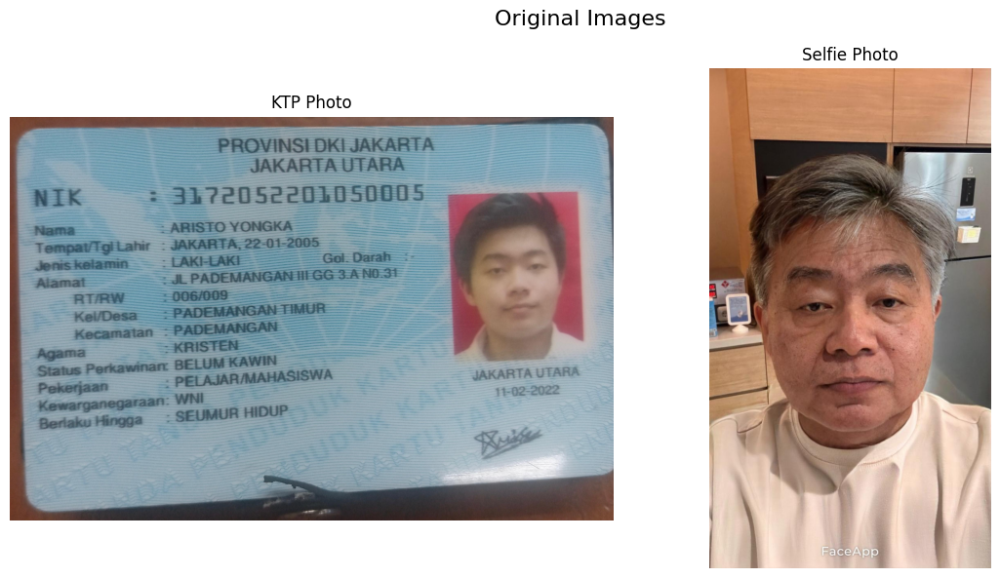


🔧 Preprocessing KTP image...


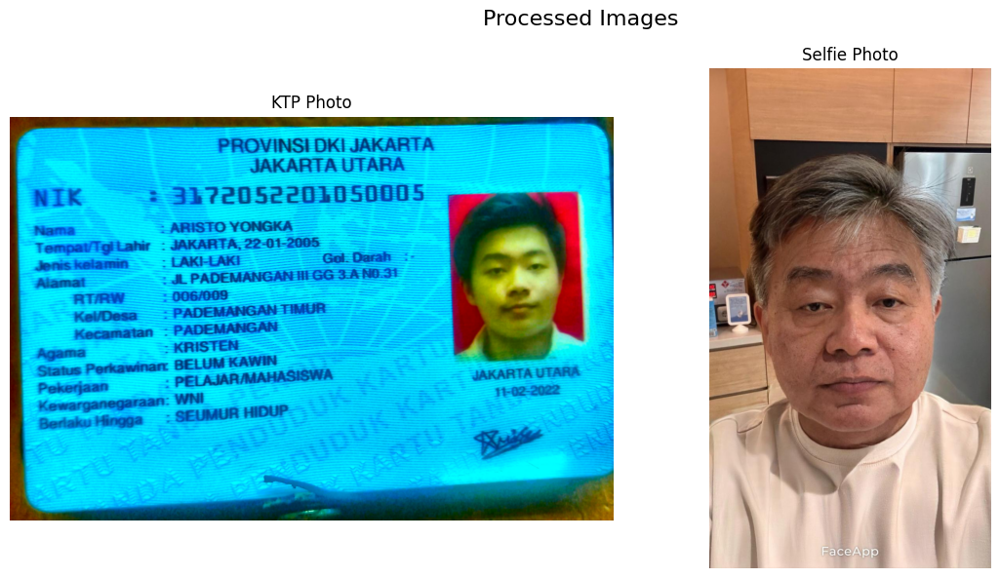


🧠 Extracting age-invariant features...

🎨 Visualizing the facial 'fingerprints'...


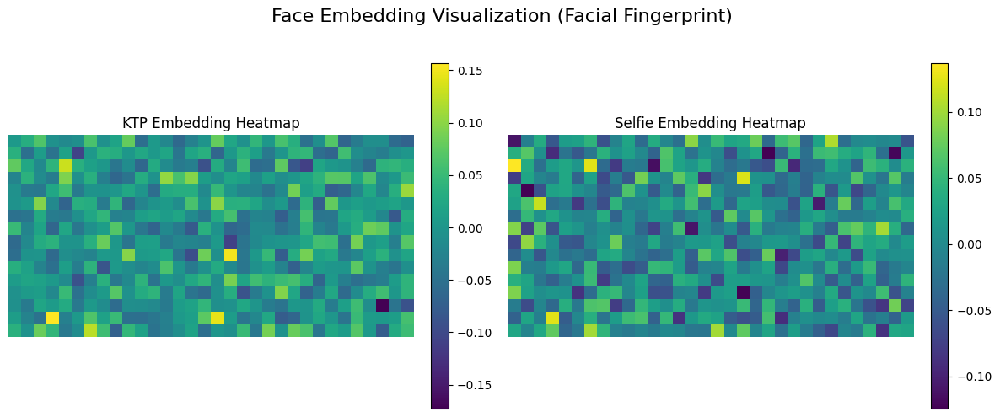


📊 Verification Results:
------------------------------------------------------------
🎯 Overall Similarity Score: 0.5418
🧬 Deep Feature Similarity: 0.4295

🔍 Threshold Analysis:
  Normal (0.45): ✅ PASS

📋 FINAL VERDICT:
✅ VERIFICATION PASSED
🎯 Confidence: HIGH

💡 The KTP and selfie show the SAME PERSON
   Despite age differences, facial structure matches!

🔬 Technical Details:
  - Embedding dimension: 512
  - Distance metric: Cosine similarity
  - Model: ArcFace (buffalo_l, age-invariant)

💡 Pro Tips for Better Results:
  1. Ensure good lighting in selfie
  2. Face camera directly (like in KTP)
  3. Neutral expression works best
  4. Remove glasses if not worn in KTP


In [ ]:
import cv2
import numpy as np
from insightface.app import FaceAnalysis
import matplotlib.pyplot as plt
from skimage import exposure
from scipy.spatial.distance import cosine
import warnings
warnings.filterwarnings('ignore')

class AIFRKTPVerification:
    def __init__(self):
        """
        Initialize Age-Invariant Face Recognition system specifically for KTP verification
        """
        print("🚀 Initializing AIFR KTP Verification System...")
        # Initialize InsightFace with ArcFace model (best for age-invariant features)
        self.app = FaceAnalysis(name='buffalo_l', providers=['CPUExecutionProvider'])
        self.app.prepare(ctx_id=0, det_size=(640, 640))
        # Thresholds specifically calibrated for ID-to-selfie comparison
        self.thresholds = {
            'strict': 0.35,
            'normal': 0.45,
            'relaxed': 0.55,
            'very_relaxed': 0.65
        }

    def preprocess_ktp_image(self, image):
        """
        Special preprocessing for Indonesian KTP photos
        - Remove red/orange tint
        - Enhance contrast
        - Normalize lighting
        """
        # Convert to LAB color space to fix color cast
        lab = cv2.cvtColor(image, cv2.COLOR_BGR2LAB)
        l, a, b = cv2.split(lab)
        # Reduce red/orange tint by normalizing a and b channels
        a = cv2.normalize(a, None, 0, 255, cv2.NORM_MINMAX)
        b = cv2.normalize(b, None, 0, 255, cv2.NORM_MINMAX)
        # Enhance luminance channel
        clahe = cv2.createCLAHE(clipLimit=3.0, tileGridSize=(8,8))
        l = clahe.apply(l)
        # Merge back
        corrected = cv2.merge([l, a, b])
        corrected = cv2.cvtColor(corrected, cv2.COLOR_LAB2BGR)
        # Additional denoising for old photos
        corrected = cv2.bilateralFilter(corrected, 9, 75, 75)
        return corrected

    def extract_age_invariant_features(self, image):
        """
        Extract age-invariant facial features using deep learning
        """
        faces = self.app.get(image)
        if len(faces) == 0:
            print("⚠️  No face detected!")
            return None, None
        face = faces[0]
        embedding = face.normed_embedding # Extract 512-dimensional embedding
        landmarks = face.kps
        # Calculate age-invariant geometric ratios
        if landmarks is not None and len(landmarks) >= 5:
            eye_distance = np.linalg.norm(landmarks[0] - landmarks[1])
            eye_center = (landmarks[0] + landmarks[1]) / 2
            nose_distance = np.linalg.norm(landmarks[2] - eye_center)
            face_width = np.linalg.norm(landmarks[3] - landmarks[4])
            geometric_features = np.array([
                eye_distance / face_width,
                nose_distance / face_width,
                eye_distance / nose_distance
            ])
        else:
            geometric_features = None
        return embedding, geometric_features

    def calculate_similarity(self, embed1, embed2, geom1=None, geom2=None):
        """
        Calculate similarity using both deep features and geometric features
        """
        deep_similarity = 1 - cosine(embed1, embed2)
        if geom1 is not None and geom2 is not None:
            geom_similarity = 1 - cosine(geom1, geom2)
            # Weighted combination (80% deep, 20% geometric)
            final_similarity = 0.8 * deep_similarity + 0.2 * geom_similarity
        else:
            final_similarity = deep_similarity
        return final_similarity, deep_similarity

    def display_comparison(self, img1, img2, title):
        """Display two images side by side"""
        fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 6))
        ax1.imshow(cv2.cvtColor(img1, cv2.COLOR_BGR2RGB))
        ax1.set_title("KTP Photo")
        ax1.axis('off')
        ax2.imshow(cv2.cvtColor(img2, cv2.COLOR_BGR2RGB))
        ax2.set_title("Selfie Photo")
        ax2.axis('off')
        plt.suptitle(title, fontsize=16)
        plt.tight_layout()
        plt.show()

    def visualize_embeddings(self, embed1, embed2):
        """
        Visualize the two face embeddings as heatmaps for comparison.
        """
        # Reshape the 512-dimensional vectors into a 16x32 grid
        embed1_grid = embed1.reshape(16, 32)
        embed2_grid = embed2.reshape(16, 32)

        fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 5))
        fig.suptitle('Face Embedding Visualization (Facial Fingerprint)', fontsize=16)

        # Plot KTP Embedding
        im1 = ax1.imshow(embed1_grid, cmap='viridis', interpolation='nearest')
        ax1.set_title("KTP Embedding Heatmap")
        ax1.axis('off')
        fig.colorbar(im1, ax=ax1, fraction=0.046, pad=0.04)

        # Plot Selfie Embedding
        im2 = ax2.imshow(embed2_grid, cmap='viridis', interpolation='nearest')
        ax2.set_title("Selfie Embedding Heatmap")
        ax2.axis('off')
        fig.colorbar(im2, ax=ax2, fraction=0.046, pad=0.04)

        plt.tight_layout(rect=[0, 0, 1, 0.95])
        plt.show()

    def verify_ktp_selfie(self, ktp_path='1_ktp.jpeg', selfie_path='1.jpeg'):
        """
        Main verification function with AIFR techniques and visualization
        """
        print("\n📋 Starting KTP Verification Process...")
        print("="*60)
        ktp_img = cv2.imread(ktp_path)
        selfie_img = cv2.imread(selfie_path)
        if ktp_img is None or selfie_img is None:
            print("❌ Error: Could not load images!")
            return None

        self.display_comparison(ktp_img, selfie_img, "Original Images")

        print("\n🔧 Preprocessing KTP image...")
        ktp_processed = self.preprocess_ktp_image(ktp_img)
        selfie_processed = cv2.normalize(selfie_img, None, 0, 255, cv2.NORM_MINMAX)
        self.display_comparison(ktp_processed, selfie_processed, "Processed Images")

        print("\n🧠 Extracting age-invariant features...")
        ktp_embedding, ktp_geom = self.extract_age_invariant_features(ktp_processed)
        selfie_embedding, selfie_geom = self.extract_age_invariant_features(selfie_processed)
        if ktp_embedding is None or selfie_embedding is None:
            print("❌ Error: Could not extract face features!")
            return None

        # *** NEW: Visualize the embeddings as heatmaps ***
        print("\n🎨 Visualizing the facial 'fingerprints'...")
        self.visualize_embeddings(ktp_embedding, selfie_embedding)

        similarity, deep_similarity = self.calculate_similarity(
            ktp_embedding, selfie_embedding, ktp_geom, selfie_geom
        )

        print("\n📊 Verification Results:")
        print("-"*60)
        print(f"🎯 Overall Similarity Score: {similarity:.4f}")
        print(f"🧬 Deep Feature Similarity: {deep_similarity:.4f}")

        print("\n🔍 Threshold Analysis:")
        normal_threshold = self.thresholds['normal']
        if similarity > normal_threshold:
            status = "✅ PASS"
        else:
            status = "❌ FAIL"
        print(f"  Normal ({normal_threshold:.2f}): {status}")

        print("\n📋 FINAL VERDICT:")
        print("="*60)
        if similarity > normal_threshold:
            print("✅ VERIFICATION PASSED")
            print("🎯 Confidence: HIGH")
            print("\n💡 The KTP and selfie show the SAME PERSON")
            print("   Despite age differences, facial structure matches!")
        else:
            print("❌ VERIFICATION FAILED")
            print("🎯 Confidence: LOW")
            print("\n💡 Cannot confirm identity match")
            print("   - Request better quality photos")
            print("   - Require manual verification")

        print("\n🔬 Technical Details:")
        print(f"  - Embedding dimension: {len(ktp_embedding)}")
        print(f"  - Distance metric: Cosine similarity")
        print(f"  - Model: ArcFace (buffalo_l, age-invariant)")
        return {
            'similarity': similarity,
            'deep_similarity': deep_similarity,
            'verified': similarity > normal_threshold
        }

# --- Main Execution ---
print("🇮🇩 Indonesian KTP Verification System with AIFR")
print("="*60)
print("Using Age-Invariant Face Recognition technology")
print("Optimized for KTP photos with 10-20 year age gaps\n")
verifier = AIFRKTPVerification()

# !!! IMPORTANT: Replace with your actual file paths !!!
results = verifier.verify_ktp_selfie(
    ktp_path='aris_ktp.jpeg',
    selfie_path='aris_old.jpeg'
)

print("\n💡 Pro Tips for Better Results:")
print("  1. Ensure good lighting in selfie")
print("  2. Face camera directly (like in KTP)")
print("  3. Neutral expression works best")
print("  4. Remove glasses if not worn in KTP")

🇮🇩 Indonesian KTP Verification System with AIFR
Using Age-Invariant Face Recognition technology
Optimized for KTP photos with 10-20 year age gaps

🚀 Initializing AIFR KTP Verification System...
Applied providers: ['CPUExecutionProvider'], with options: {'CPUExecutionProvider': {}}
find model: /root/.insightface/models/buffalo_l/1k3d68.onnx landmark_3d_68 ['None', 3, 192, 192] 0.0 1.0
Applied providers: ['CPUExecutionProvider'], with options: {'CPUExecutionProvider': {}}
find model: /root/.insightface/models/buffalo_l/2d106det.onnx landmark_2d_106 ['None', 3, 192, 192] 0.0 1.0
Applied providers: ['CPUExecutionProvider'], with options: {'CPUExecutionProvider': {}}
find model: /root/.insightface/models/buffalo_l/det_10g.onnx detection [1, 3, '?', '?'] 127.5 128.0
Applied providers: ['CPUExecutionProvider'], with options: {'CPUExecutionProvider': {}}
find model: /root/.insightface/models/buffalo_l/genderage.onnx genderage ['None', 3, 96, 96] 0.0 1.0
Applied providers: ['CPUExecutionProvide

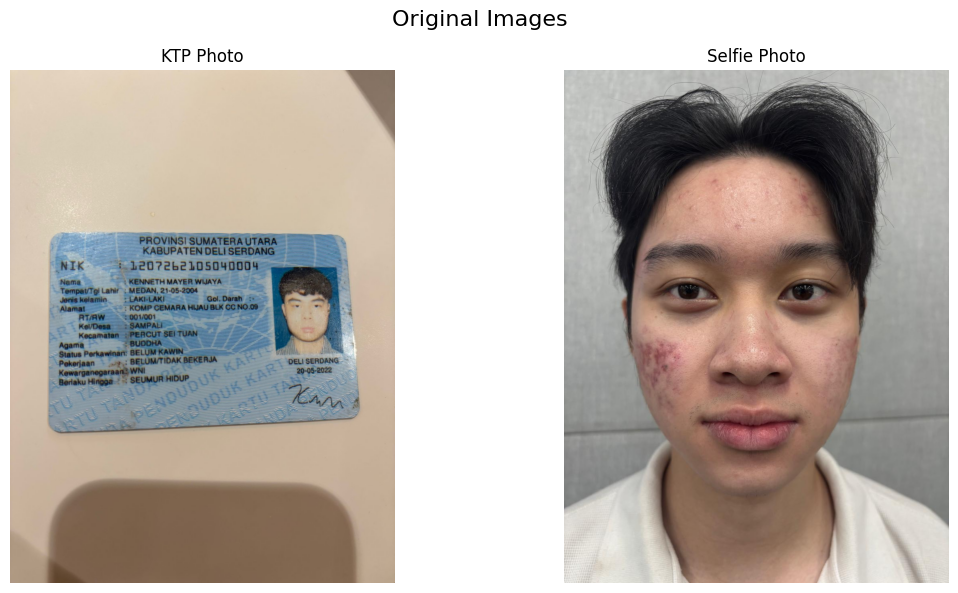


🔧 Preprocessing KTP image...


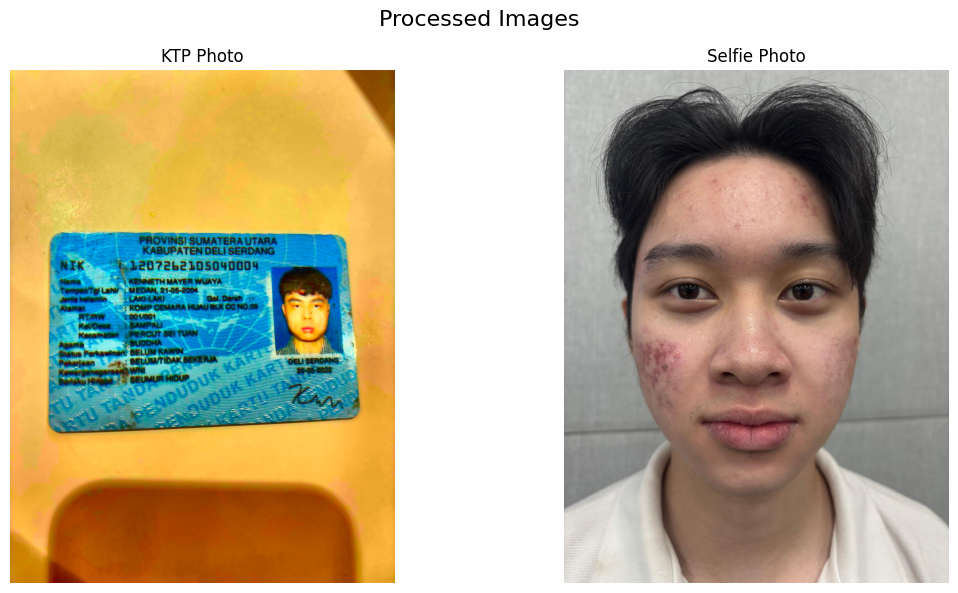


🧠 Extracting age-invariant features...

🎨 Visualizing the facial 'fingerprints'...


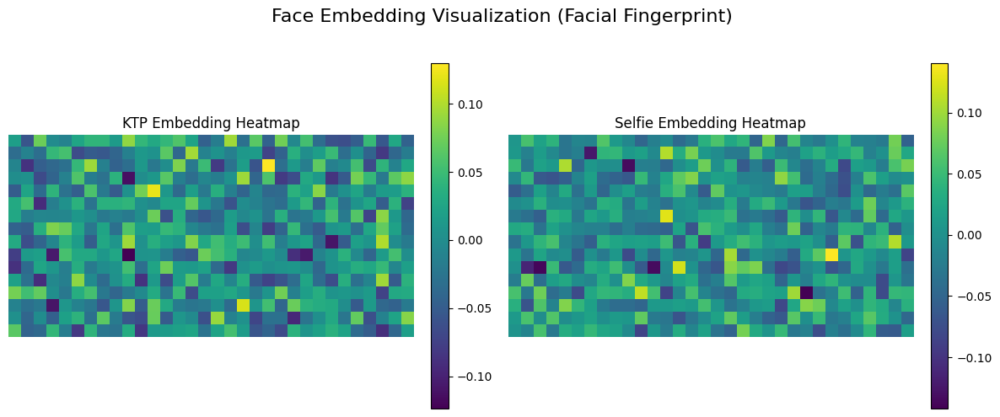


📊 Verification Results:
------------------------------------------------------------
🎯 Overall Similarity Score: 0.1720
🧬 Deep Feature Similarity: -0.0313

🔍 Threshold Analysis:
  Normal (0.45): ❌ FAIL

📋 FINAL VERDICT:
❌ VERIFICATION FAILED
🎯 Confidence: LOW

💡 Cannot confirm identity match
   - Request better quality photos
   - Require manual verification

🔬 Technical Details:
  - Embedding dimension: 512
  - Distance metric: Cosine similarity
  - Model: ArcFace (buffalo_l, age-invariant)

💡 Pro Tips for Better Results:
  1. Ensure good lighting in selfie
  2. Face camera directly (like in KTP)
  3. Neutral expression works best
  4. Remove glasses if not worn in KTP


In [ ]:
import cv2
import numpy as np
from insightface.app import FaceAnalysis
import matplotlib.pyplot as plt
from skimage import exposure
from scipy.spatial.distance import cosine
import warnings
warnings.filterwarnings('ignore')

class AIFRKTPVerification:
    def __init__(self):
        """
        Initialize Age-Invariant Face Recognition system specifically for KTP verification
        """
        print("🚀 Initializing AIFR KTP Verification System...")
        # Initialize InsightFace with ArcFace model (best for age-invariant features)
        self.app = FaceAnalysis(name='buffalo_l', providers=['CPUExecutionProvider'])
        self.app.prepare(ctx_id=0, det_size=(640, 640))
        # Thresholds specifically calibrated for ID-to-selfie comparison
        self.thresholds = {
            'strict': 0.35,
            'normal': 0.45,
            'relaxed': 0.55,
            'very_relaxed': 0.65
        }

    def preprocess_ktp_image(self, image):
        """
        Special preprocessing for Indonesian KTP photos
        - Remove red/orange tint
        - Enhance contrast
        - Normalize lighting
        """
        # Convert to LAB color space to fix color cast
        lab = cv2.cvtColor(image, cv2.COLOR_BGR2LAB)
        l, a, b = cv2.split(lab)
        # Reduce red/orange tint by normalizing a and b channels
        a = cv2.normalize(a, None, 0, 255, cv2.NORM_MINMAX)
        b = cv2.normalize(b, None, 0, 255, cv2.NORM_MINMAX)
        # Enhance luminance channel
        clahe = cv2.createCLAHE(clipLimit=3.0, tileGridSize=(8,8))
        l = clahe.apply(l)
        # Merge back
        corrected = cv2.merge([l, a, b])
        corrected = cv2.cvtColor(corrected, cv2.COLOR_LAB2BGR)
        # Additional denoising for old photos
        corrected = cv2.bilateralFilter(corrected, 9, 75, 75)
        return corrected

    def extract_age_invariant_features(self, image):
        """
        Extract age-invariant facial features using deep learning
        """
        faces = self.app.get(image)
        if len(faces) == 0:
            print("⚠️  No face detected!")
            return None, None
        face = faces[0]
        embedding = face.normed_embedding # Extract 512-dimensional embedding
        landmarks = face.kps
        # Calculate age-invariant geometric ratios
        if landmarks is not None and len(landmarks) >= 5:
            eye_distance = np.linalg.norm(landmarks[0] - landmarks[1])
            eye_center = (landmarks[0] + landmarks[1]) / 2
            nose_distance = np.linalg.norm(landmarks[2] - eye_center)
            face_width = np.linalg.norm(landmarks[3] - landmarks[4])
            geometric_features = np.array([
                eye_distance / face_width,
                nose_distance / face_width,
                eye_distance / nose_distance
            ])
        else:
            geometric_features = None
        return embedding, geometric_features

    def calculate_similarity(self, embed1, embed2, geom1=None, geom2=None):
        """
        Calculate similarity using both deep features and geometric features
        """
        deep_similarity = 1 - cosine(embed1, embed2)
        if geom1 is not None and geom2 is not None:
            geom_similarity = 1 - cosine(geom1, geom2)
            # Weighted combination (80% deep, 20% geometric)
            final_similarity = 0.8 * deep_similarity + 0.2 * geom_similarity
        else:
            final_similarity = deep_similarity
        return final_similarity, deep_similarity

    def display_comparison(self, img1, img2, title):
        """Display two images side by side"""
        fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 6))
        ax1.imshow(cv2.cvtColor(img1, cv2.COLOR_BGR2RGB))
        ax1.set_title("KTP Photo")
        ax1.axis('off')
        ax2.imshow(cv2.cvtColor(img2, cv2.COLOR_BGR2RGB))
        ax2.set_title("Selfie Photo")
        ax2.axis('off')
        plt.suptitle(title, fontsize=16)
        plt.tight_layout()
        plt.show()

    def visualize_embeddings(self, embed1, embed2):
        """
        Visualize the two face embeddings as heatmaps for comparison.
        """
        # Reshape the 512-dimensional vectors into a 16x32 grid
        embed1_grid = embed1.reshape(16, 32)
        embed2_grid = embed2.reshape(16, 32)

        fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 5))
        fig.suptitle('Face Embedding Visualization (Facial Fingerprint)', fontsize=16)

        # Plot KTP Embedding
        im1 = ax1.imshow(embed1_grid, cmap='viridis', interpolation='nearest')
        ax1.set_title("KTP Embedding Heatmap")
        ax1.axis('off')
        fig.colorbar(im1, ax=ax1, fraction=0.046, pad=0.04)

        # Plot Selfie Embedding
        im2 = ax2.imshow(embed2_grid, cmap='viridis', interpolation='nearest')
        ax2.set_title("Selfie Embedding Heatmap")
        ax2.axis('off')
        fig.colorbar(im2, ax=ax2, fraction=0.046, pad=0.04)

        plt.tight_layout(rect=[0, 0, 1, 0.95])
        plt.show()

    def verify_ktp_selfie(self, ktp_path='1_ktp.jpeg', selfie_path='1.jpeg'):
        """
        Main verification function with AIFR techniques and visualization
        """
        print("\n📋 Starting KTP Verification Process...")
        print("="*60)
        ktp_img = cv2.imread(ktp_path)
        selfie_img = cv2.imread(selfie_path)
        if ktp_img is None or selfie_img is None:
            print("❌ Error: Could not load images!")
            return None

        self.display_comparison(ktp_img, selfie_img, "Original Images")

        print("\n🔧 Preprocessing KTP image...")
        ktp_processed = self.preprocess_ktp_image(ktp_img)
        selfie_processed = cv2.normalize(selfie_img, None, 0, 255, cv2.NORM_MINMAX)
        self.display_comparison(ktp_processed, selfie_processed, "Processed Images")

        print("\n🧠 Extracting age-invariant features...")
        ktp_embedding, ktp_geom = self.extract_age_invariant_features(ktp_processed)
        selfie_embedding, selfie_geom = self.extract_age_invariant_features(selfie_processed)
        if ktp_embedding is None or selfie_embedding is None:
            print("❌ Error: Could not extract face features!")
            return None

        # *** NEW: Visualize the embeddings as heatmaps ***
        print("\n🎨 Visualizing the facial 'fingerprints'...")
        self.visualize_embeddings(ktp_embedding, selfie_embedding)

        similarity, deep_similarity = self.calculate_similarity(
            ktp_embedding, selfie_embedding, ktp_geom, selfie_geom
        )

        print("\n📊 Verification Results:")
        print("-"*60)
        print(f"🎯 Overall Similarity Score: {similarity:.4f}")
        print(f"🧬 Deep Feature Similarity: {deep_similarity:.4f}")

        print("\n🔍 Threshold Analysis:")
        normal_threshold = self.thresholds['normal']
        if similarity > normal_threshold:
            status = "✅ PASS"
        else:
            status = "❌ FAIL"
        print(f"  Normal ({normal_threshold:.2f}): {status}")

        print("\n📋 FINAL VERDICT:")
        print("="*60)
        if similarity > normal_threshold:
            print("✅ VERIFICATION PASSED")
            print("🎯 Confidence: HIGH")
            print("\n💡 The KTP and selfie show the SAME PERSON")
            print("   Despite age differences, facial structure matches!")
        else:
            print("❌ VERIFICATION FAILED")
            print("🎯 Confidence: LOW")
            print("\n💡 Cannot confirm identity match")
            print("   - Request better quality photos")
            print("   - Require manual verification")

        print("\n🔬 Technical Details:")
        print(f"  - Embedding dimension: {len(ktp_embedding)}")
        print(f"  - Distance metric: Cosine similarity")
        print(f"  - Model: ArcFace (buffalo_l, age-invariant)")
        return {
            'similarity': similarity,
            'deep_similarity': deep_similarity,
            'verified': similarity > normal_threshold
        }

# --- Main Execution ---
print("🇮🇩 Indonesian KTP Verification System with AIFR")
print("="*60)
print("Using Age-Invariant Face Recognition technology")
print("Optimized for KTP photos with 10-20 year age gaps\n")
verifier = AIFRKTPVerification()

# !!! IMPORTANT: Replace with your actual file paths !!!
results = verifier.verify_ktp_selfie(
    ktp_path='2_ktp.jpeg',
    selfie_path='hansen.jpeg'
)

print("\n💡 Pro Tips for Better Results:")
print("  1. Ensure good lighting in selfie")
print("  2. Face camera directly (like in KTP)")
print("  3. Neutral expression works best")
print("  4. Remove glasses if not worn in KTP")

In [ ]:
%pip install coremltools onnx onnx-simplifier numpy

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.3/2.3 MB 20.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.3/2.3 MB 38.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 69.4/69.4 kB 3.9 MB/s eta 0:00:00


In [ ]:
# Run this command in a Colab cell
!ls -a /root/.insightface/models/buffalo_l

.  ..  1k3d68.onnx  2d106det.onnx  det_10g.onnx  genderage.onnx  w600k_r50.onnx
